
# $$ \textbf{Dalitz Decay Identification with Machine Learning Techniques}$$

# $$\text{Yuhao Peng}$$

In [1]:
! pip install uproot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.3/362.3 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.1/865.1 kB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 636.7/636.7 kB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 16.3 MB/s eta 0:00:00


In [2]:
import uproot
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import math
import itertools

import tensorflow as tf
from tensorflow.keras.activations import relu,linear,sigmoid
from tensorflow.keras.layers import Input, Dense, Dropout,BatchNormalization
from tensorflow.keras.losses import BinaryCrossentropy
from IPython.display import clear_output
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras import optimizers

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from imblearn.under_sampling import NearMiss
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Load data

In [3]:
tree = uproot.open("/content/mcphipre.root:tau")

In [4]:
raw_data = tree.arrays(library='pd') #convert tree into panda

In [5]:
raw_data.info(verbose=True,show_counts=True)  #show raw_data infomation

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39248 entries, 0 to 39247
Data columns (total 596 columns):
 #    Column                                                          Non-Null Count  Dtype  
---   ------                                                          --------------  -----  
 0    __experiment__                                                  39248 non-null  int32  
 1    __run__                                                         39248 non-null  int32  
 2    __event__                                                       39248 non-null  uint32 
 3    __production__                                                  39248 non-null  int32  
 4    __candidate__                                                   39248 non-null  int32  
 5    __ncandidates__                                                 39248 non-null  int32  
 6    __weight__                                                      39248 non-null  float64
 7    EoverP                                

# $$\textbf{Data cleaning}$$


## Drop redundant features:  general information of the experiment run

In [6]:
data = raw_data.drop(raw_data.columns[:24], axis=1)

## Drop nan and infinity

In [7]:
data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [8]:
data =data.dropna(axis=1,how='all')

## Drop MC, ID, charge, tag, pip ($\pi^+$)

In [9]:
mask = data.columns.str.contains('MC')
data = data.iloc[:,~mask]
mask = data.columns.str.contains('mc')
data = data.iloc[:,~mask]
mask = data.columns.str.contains('ID')
data = data.iloc[:,~mask]
mask = data.columns.str.contains('charge')
data = data.iloc[:,~mask]
mask = data.columns.str.contains('tag')
data = data.iloc[:,~mask]
mask = data.columns.str.contains('pip')
data = data.iloc[:,~mask]

## Drop bad values, which has 0 variance

In [10]:
data = data.loc[:, data.nunique() != 1]

In [11]:
data.info(verbose=True,show_counts=True) #show data infomation

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39248 entries, 0 to 39247
Data columns (total 171 columns):
 #    Column                                       Non-Null Count  Dtype  
---   ------                                       --------------  -----  
 0    Ap_convertedPhotonDelR_0_1                   39248 non-null  float64
 1    Ap_convertedPhotonDelTanLambda_0_1           39248 non-null  float64
 2    Ap_convertedPhotonDelZ_0_1                   39248 non-null  float64
 3    Ap_convertedPhotonInvariantMass_0_1          39248 non-null  float64
 4    Ap_convertedPhotonPx_0_1                     39248 non-null  float64
 5    Ap_convertedPhotonPy_0_1                     39248 non-null  float64
 6    Ap_convertedPhotonPz_0_1                     39248 non-null  float64
 7    Ap_convertedPhotonRho_0_1                    39248 non-null  float64
 8    Ap_convertedPhotonX_0_1                      39248 non-null  float64
 9    Ap_convertedPhotonY_0_1                      39248 non-null

In [12]:
data = data.drop(columns = data.columns[(data.count() <37438)])

## Define a signal classifier to determine index of dalitz and non-dalitz

In [13]:
def sig_classifier(data):
    ep_mpdg= data["ep_genMotherPDG"].values
    em_mpdg= data["em_genMotherPDG"].values
    idx = np.where((ep_mpdg==111)&(em_mpdg == 111))[0]
    #cidx = np.where((ep_mpdg==22)&(em_mpdg == 22))[0]
    nidx = np.where((ep_mpdg!=111)|(em_mpdg != 111))[0]
    return idx,nidx

## Check colomuns with non-null entries between 37438 and 39248

In [14]:
ndata = data[data.columns[(data.count() <39248)]]
ndata = ndata.assign(ep_genMotherPDG=data["ep_genMotherPDG"].values,\
                     em_genMotherPDG=data["em_genMotherPDG"].values)

## Drop NaNs in row

In [15]:
ndata = ndata.dropna(axis = 0, how='any')

In [16]:
idx,nidx = sig_classifier(ndata)

In [17]:
mask = ndata.columns.str.contains('genMother')
ndata = ndata.iloc[:,~mask]

In [18]:
ndata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36661 entries, 0 to 39247
Data columns (total 10 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Ap_ErrM                              36661 non-null  float64
 1   Ap_SigM                              36661 non-null  float64
 2   ep_isSignalAcceptMissingNeutrino     36661 non-null  float64
 3   ep_isSignal                          36661 non-null  float64
 4   ep_isCloneTrack                      36661 non-null  float64
 5   em_isSignalAcceptMissingNeutrino     36661 non-null  float64
 6   em_isSignal                          36661 non-null  float64
 7   em_isCloneTrack                      36661 non-null  float64
 8   gamma_isSignalAcceptMissingNeutrino  36661 non-null  float64
 9   gamma_isSignal                       36661 non-null  float64
dtypes: float64(10)
memory usage: 3.1 MB


## Dataframe info above shows dropping NaNs in row can significantly reduce the size of dataset due to the distribution of NaNs across different features.

## Define function to make histograms for features

In [19]:
def feature_plot(data):
    feature = np.array(data.columns.tolist())
    for i in range(len(feature)):

        dalitz = data.values[idx,i]
        conv = data.values[nidx,i]

        ad = np.percentile(dalitz, 0)
        ac = np.percentile(conv, 0)

        bd = np.percentile(dalitz, 99)
        bc = np.percentile(conv, 99)

        lower = min(ad,ac)
        upper = min(bd,bc)

        plt.hist(dalitz,bins = 50,range =(lower,upper),histtype='step',label = 'Dalitz, entries:%s'%len(dalitz))
        plt.hist(conv,bins = 50,range =(lower,upper),histtype='step',label = 'Non_Dalitz, entries:%s'%len(conv))
        plt.title(feature[i])
        plt.ylabel('# of events')
        plt.legend(loc = 'best')
        plt.show()

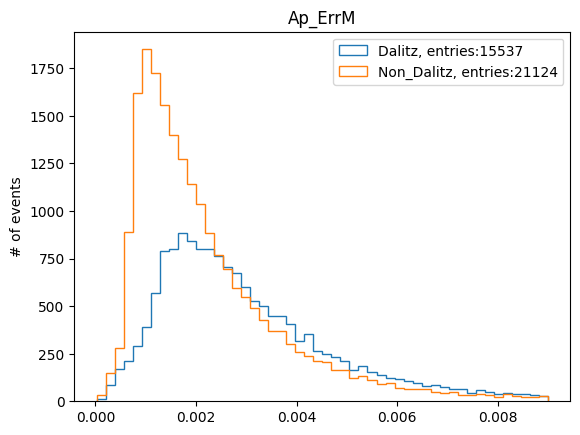

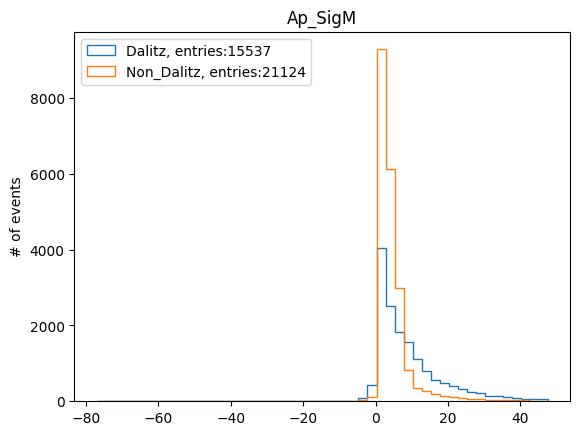

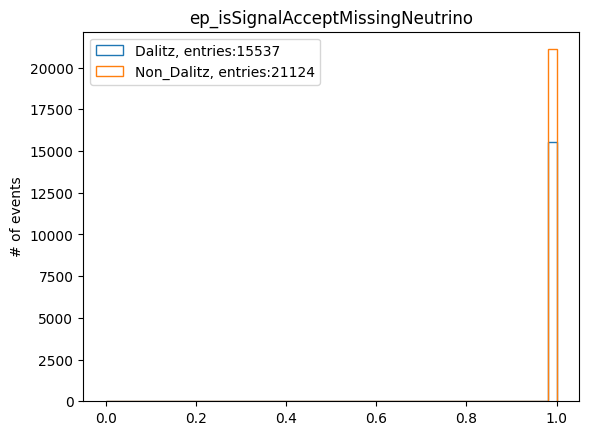

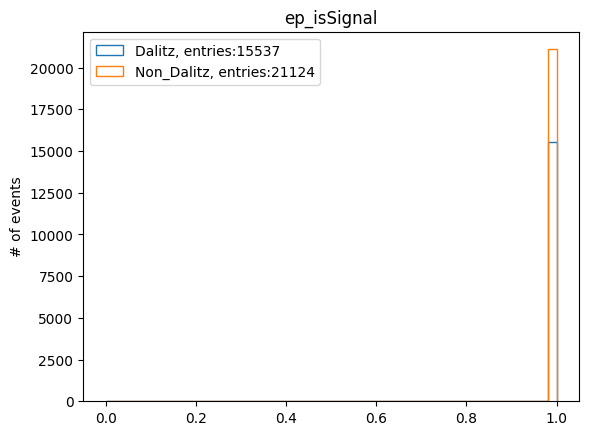

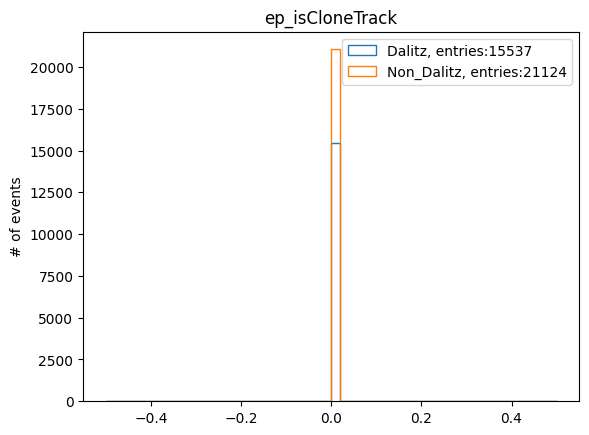

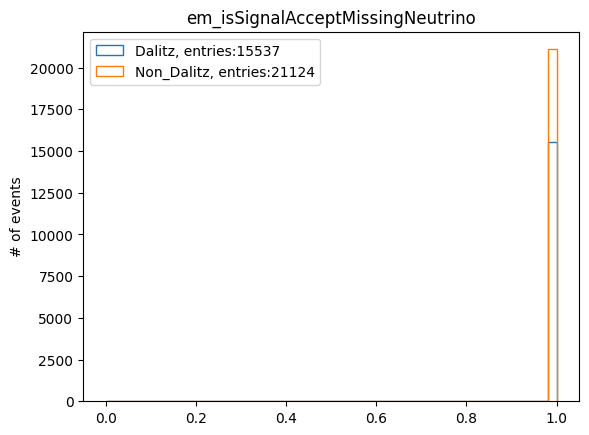

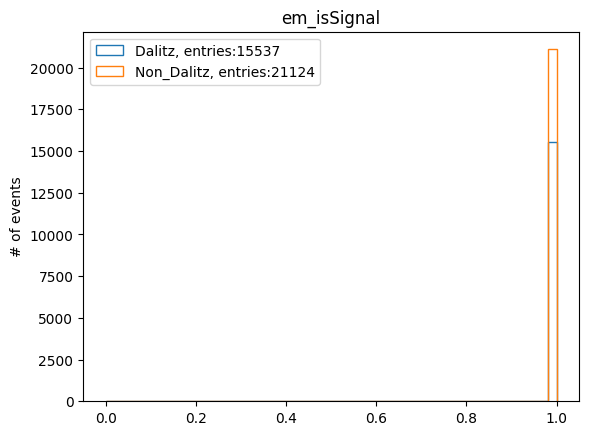

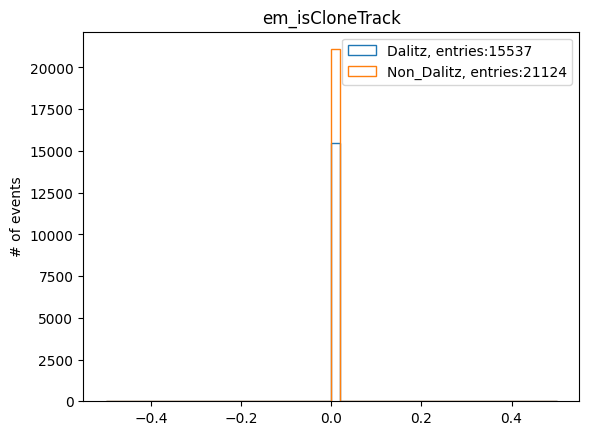

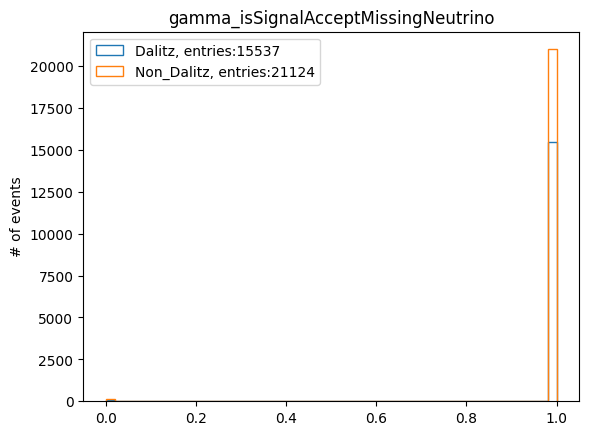

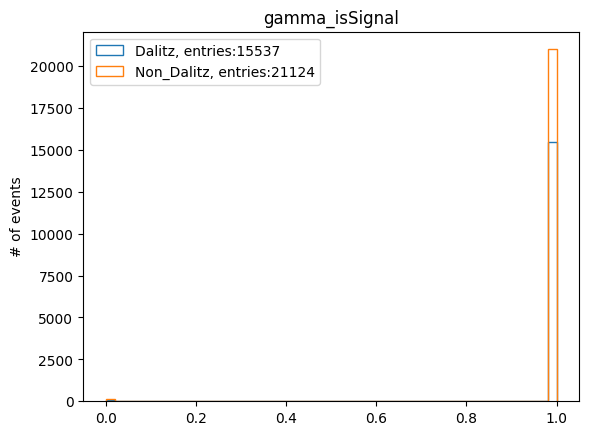

In [20]:
feature_plot(ndata)

## It can be seen that these features are not very distinguishable between Dalitz and Non-Dalitz. Also, we that spatial displacements of Ap are the most important features. Thus, these column will nans are dropped.

In [21]:
data =data.dropna(axis=1,how='any')

## Determine index of dalitz and non-dalitz in data

In [22]:
idx,nidx = sig_classifier(data)

In [23]:
mask = data.columns.str.contains('genMother')
data = data.iloc[:,~mask]

## As the dataframe info below shows, the dataset now has 6 type of events: tau\_sig ($\tau^-$), pi0 $(\pi^0)$, Ap (A'), ep ($e^+$), em ($e^-$), and gamma (photon),

## Additionally, the dataset includes features of vertex reconstruction, such as phidiff and dphidiff.

In [24]:
data.info(verbose=True,show_counts=True) #show data infomation

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39248 entries, 0 to 39247
Data columns (total 141 columns):
 #    Column                                       Non-Null Count  Dtype  
---   ------                                       --------------  -----  
 0    Ap_convertedPhotonDelR_0_1                   39248 non-null  float64
 1    Ap_convertedPhotonDelTanLambda_0_1           39248 non-null  float64
 2    Ap_convertedPhotonDelZ_0_1                   39248 non-null  float64
 3    Ap_convertedPhotonInvariantMass_0_1          39248 non-null  float64
 4    Ap_convertedPhotonPx_0_1                     39248 non-null  float64
 5    Ap_convertedPhotonPy_0_1                     39248 non-null  float64
 6    Ap_convertedPhotonPz_0_1                     39248 non-null  float64
 7    Ap_convertedPhotonRho_0_1                    39248 non-null  float64
 8    Ap_convertedPhotonX_0_1                      39248 non-null  float64
 9    Ap_convertedPhotonY_0_1                      39248 non-null

## Define function to make correlation matrix

In [25]:
def comax(data):
    colormap = plt.cm.GnBu
    plt.figure(figsize=(15,12))
    cor = data.corr()
    sns.heatmap(cor, linewidths=0.1, square=True, cmap=colormap, linecolor='white',  annot=False)
    plt.title('Correlation of Features',size=20)
    plt.xticks(rotation=45, ha='right')
    plt.show()

## Ap (A')

In [26]:
mask = data.columns.str.contains('Ap')
Ap_data = data.iloc[:,mask]

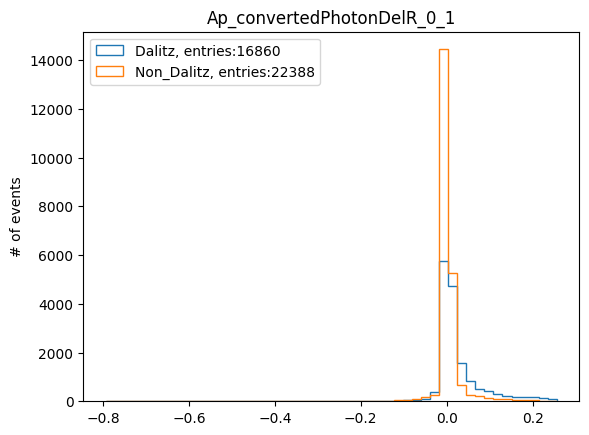

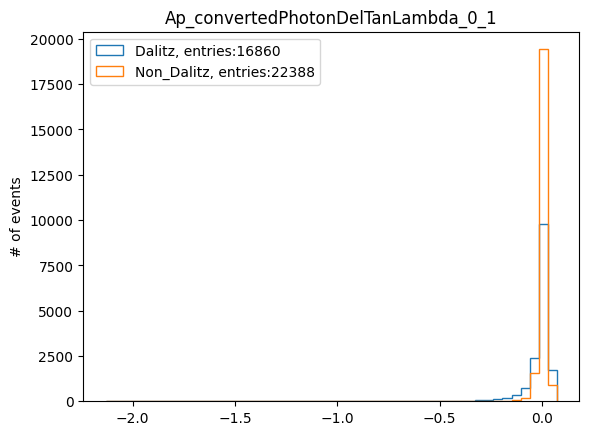

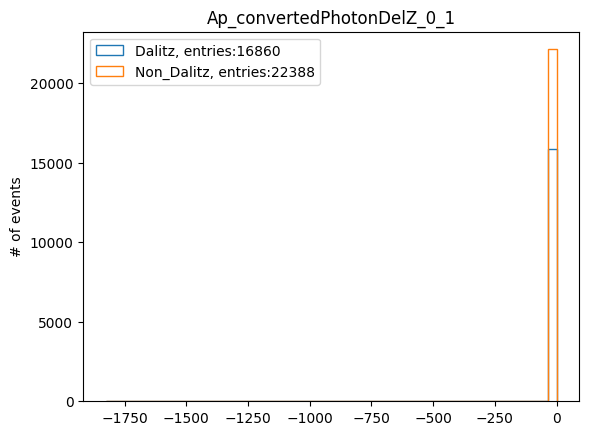

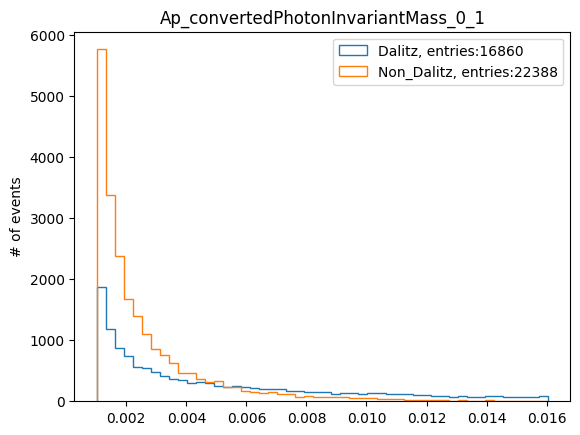

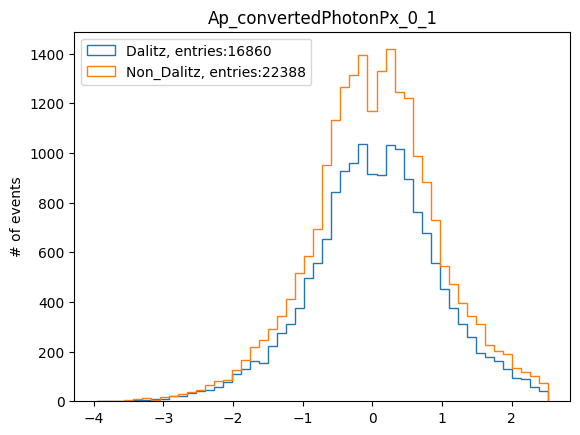

...

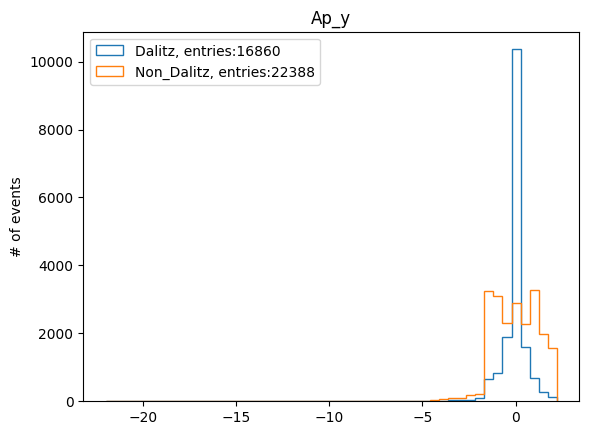

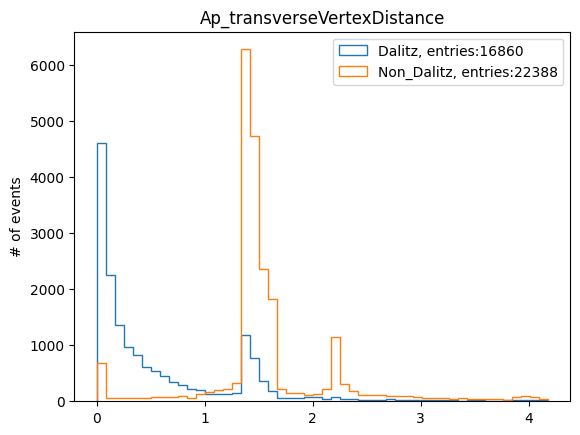

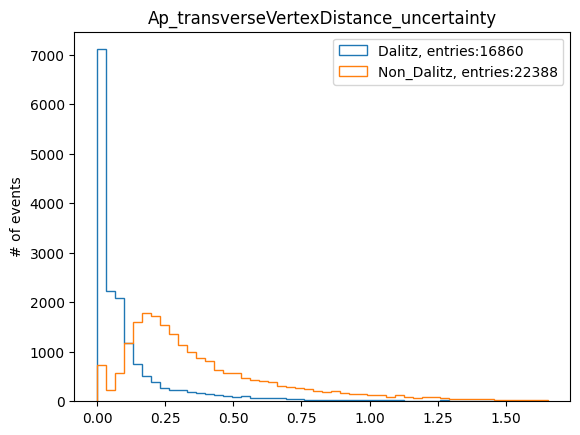

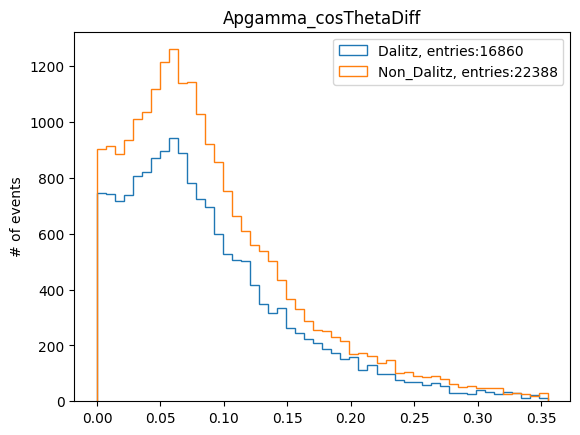

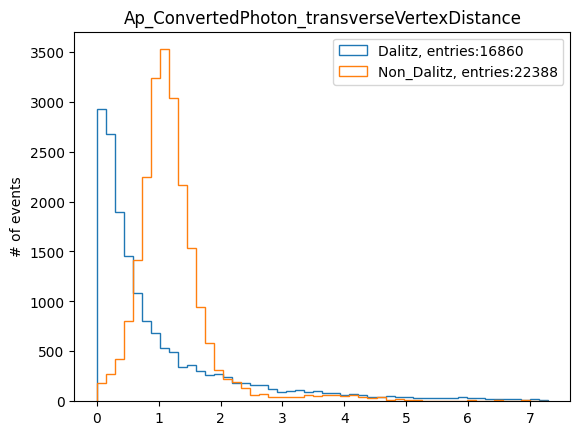

In [27]:
feature_plot(Ap_data)

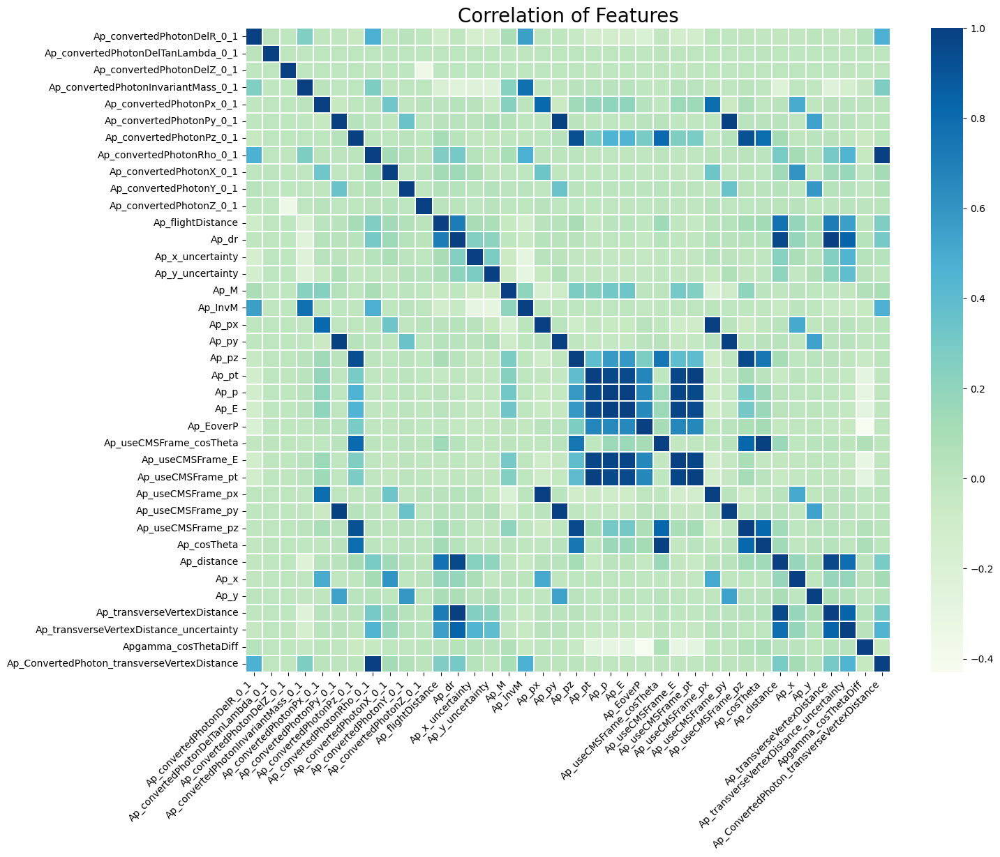

In [28]:
comax(Ap_data)

## tau_sig ($\tau^-$)

In [29]:
mask = data.columns.str.contains('tau')
tau_data = data.iloc[:,mask]

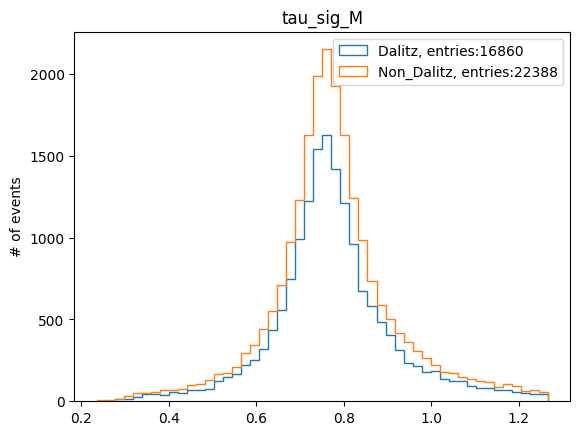

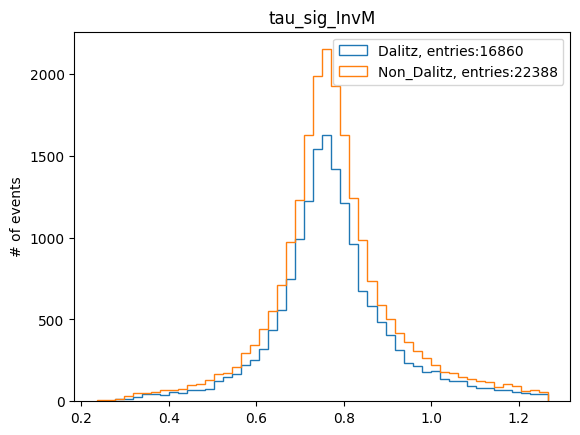

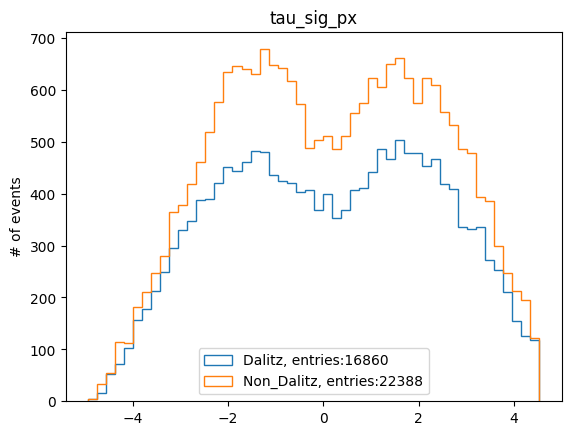

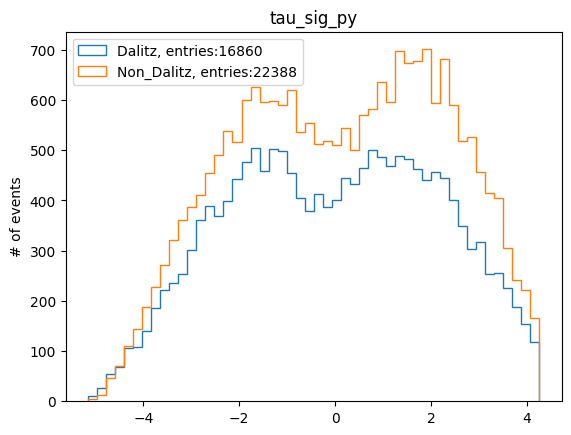

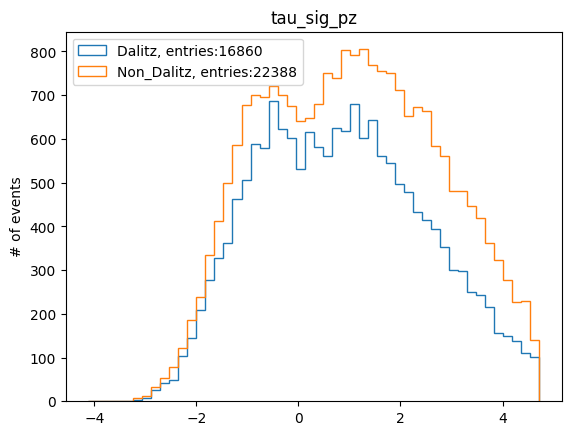

...

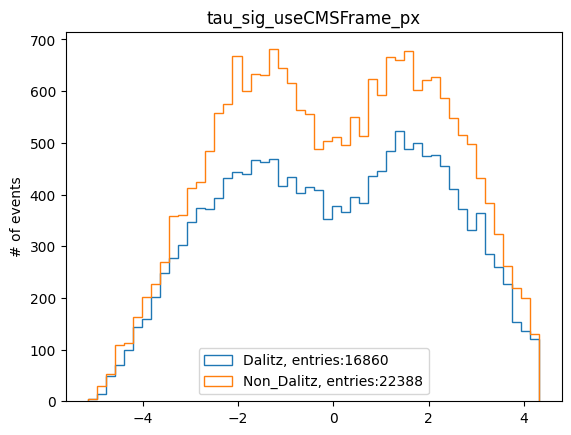

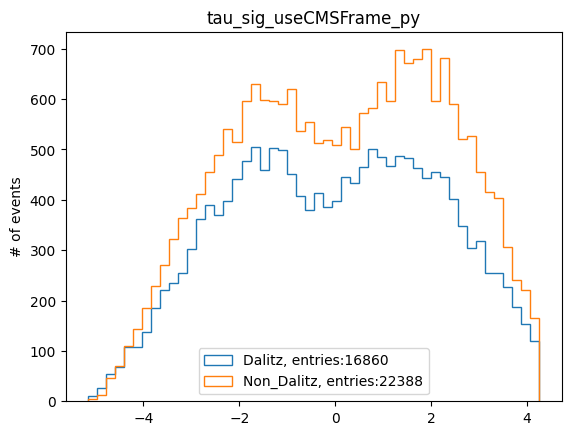

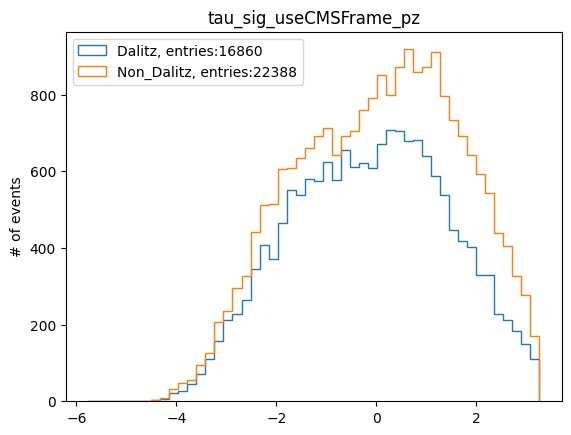

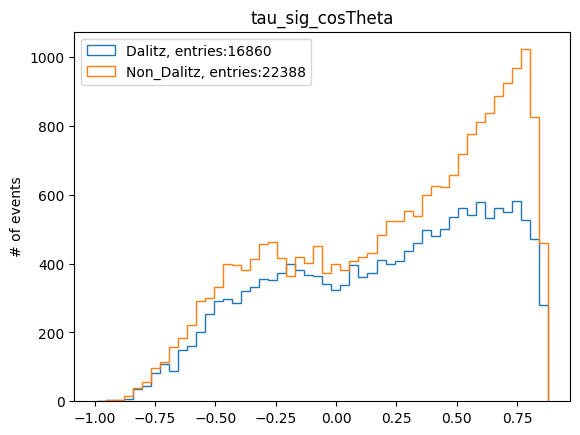

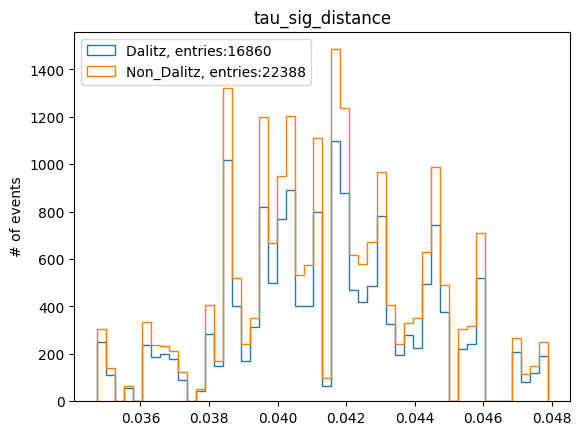

In [30]:
feature_plot(tau_data)

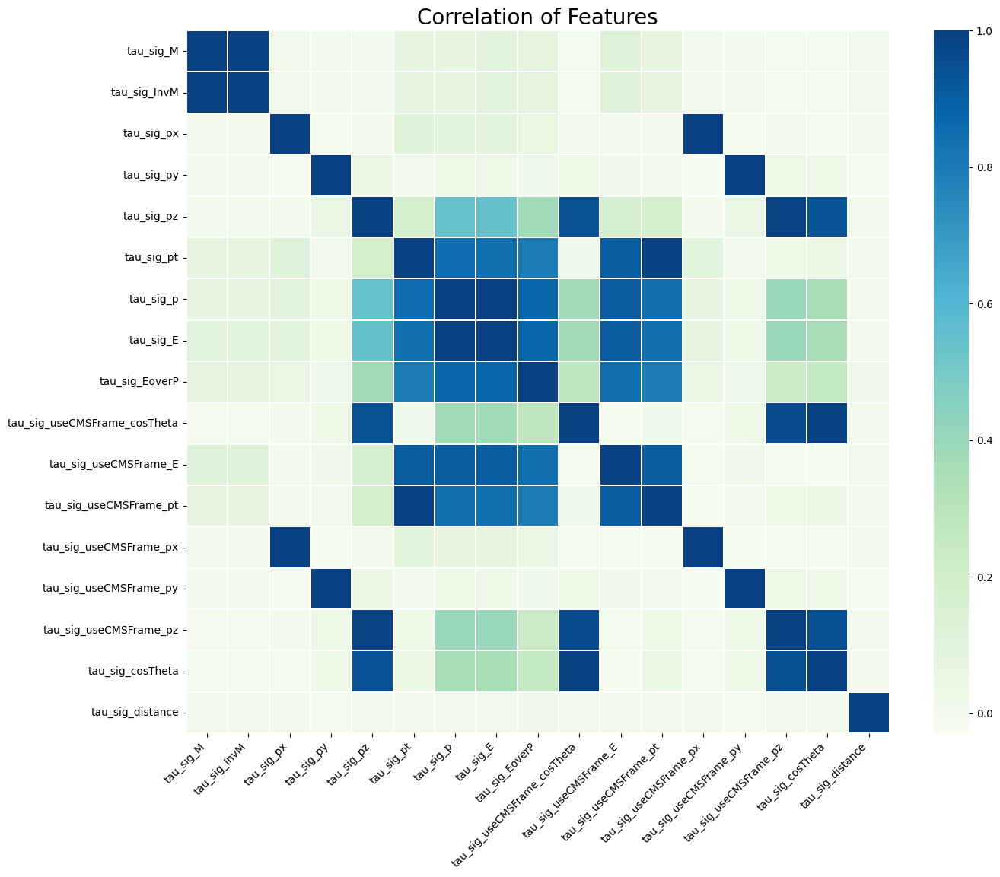

In [31]:
comax(tau_data)

## ep $(e^+)$

In [32]:
mask = data.columns.str.contains('ep')
ep_data = data.iloc[:,mask]

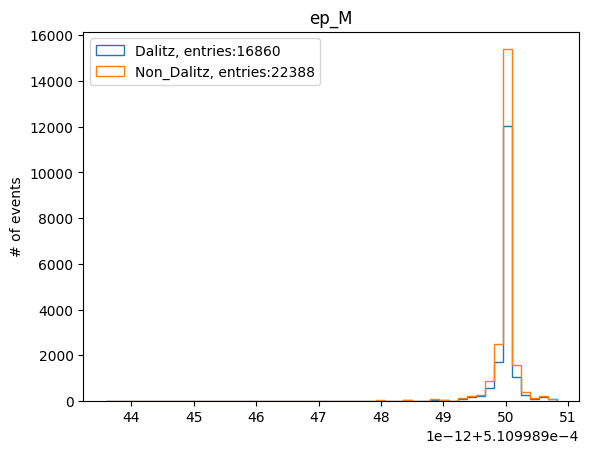

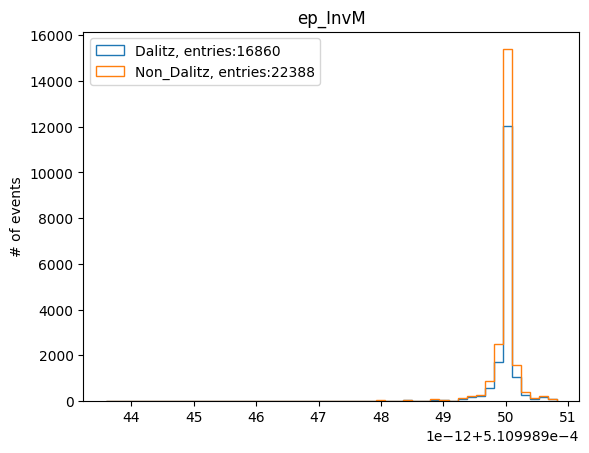

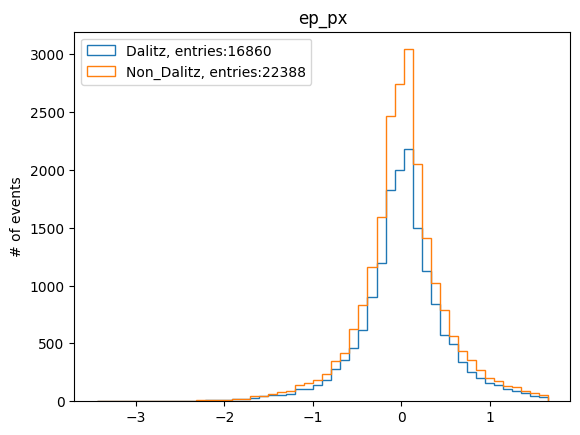

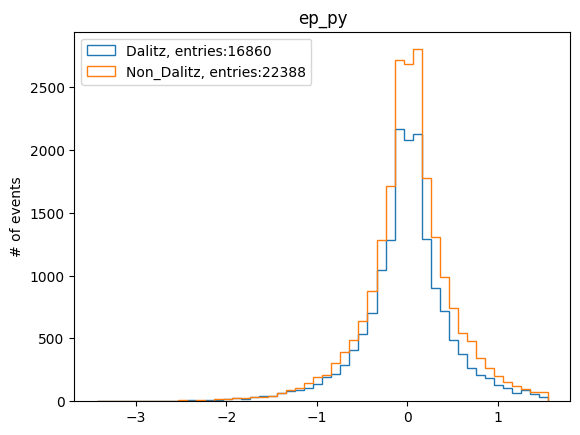

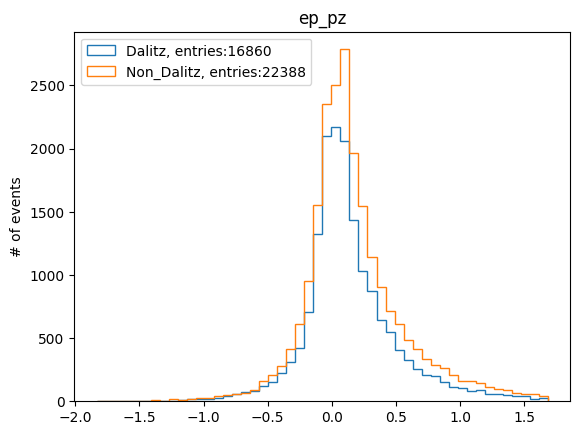

...

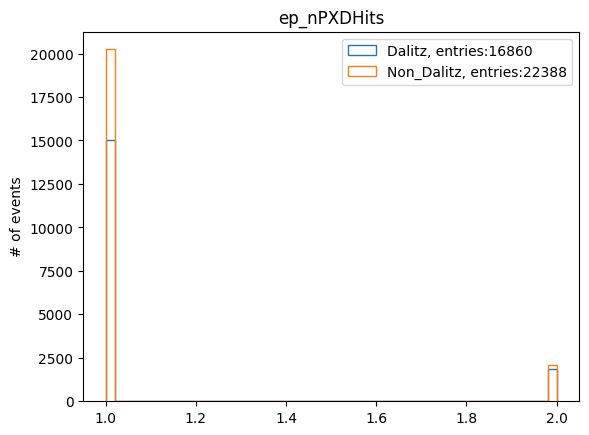

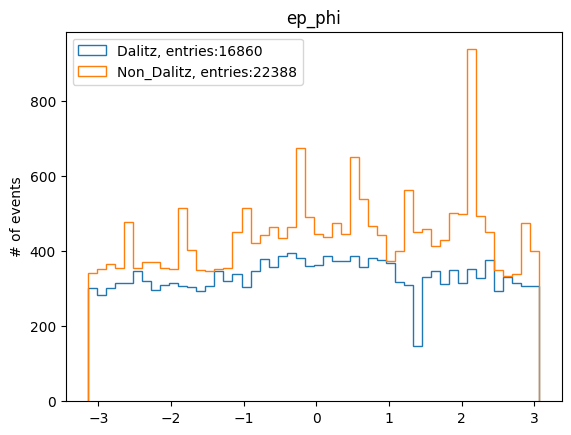

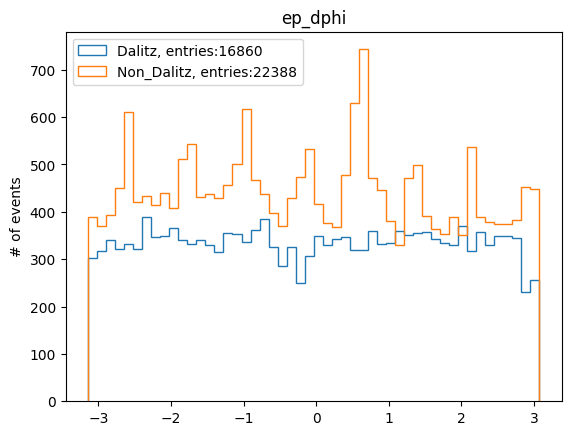

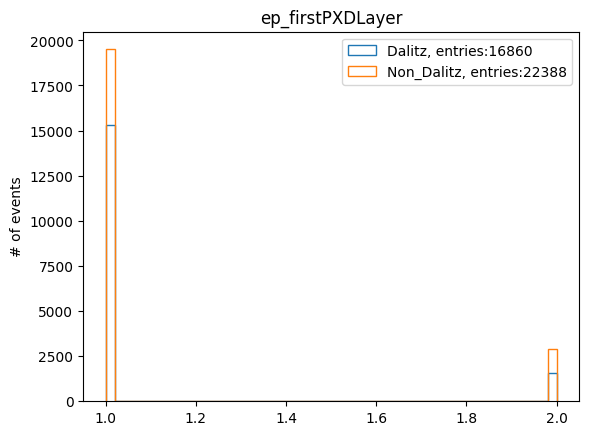

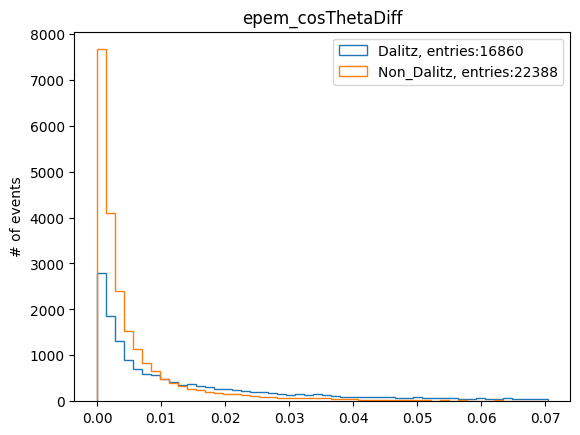

In [33]:
feature_plot(ep_data)

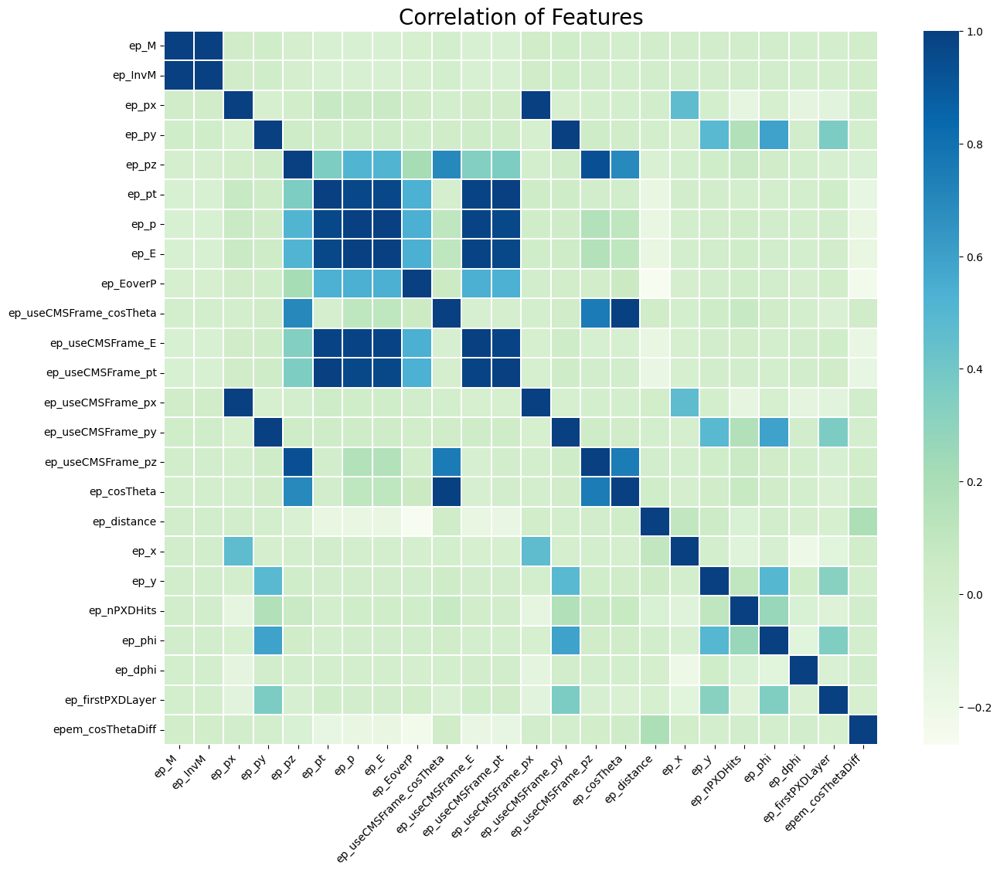

In [34]:
comax(ep_data)

## em $(e^-)$

In [35]:
mask = data.columns.str.contains('em')
em_data = data.iloc[:,mask]

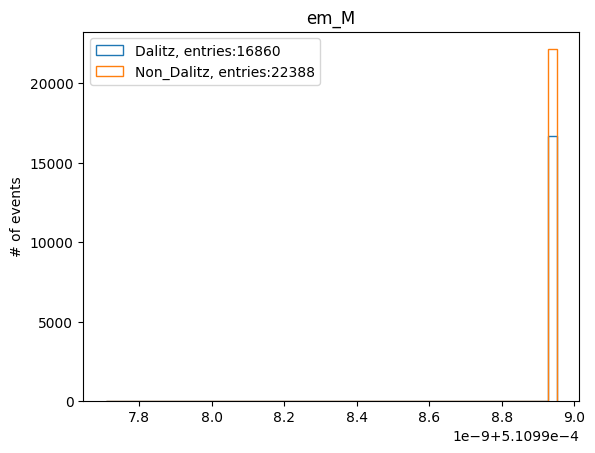

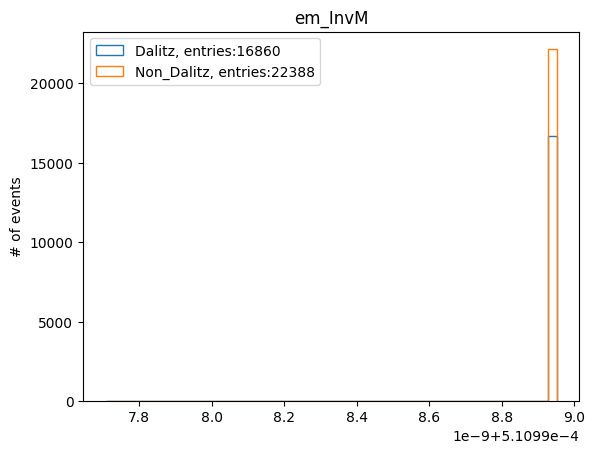

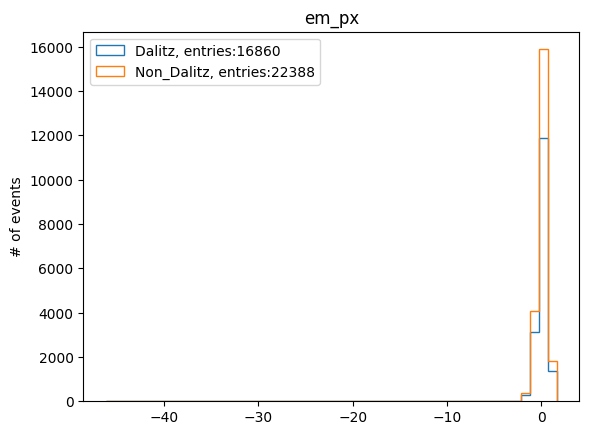

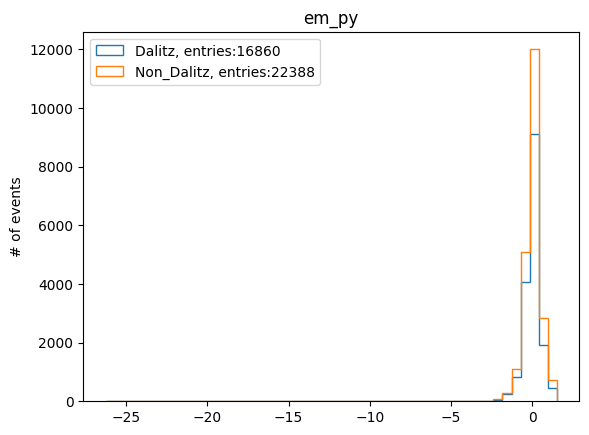

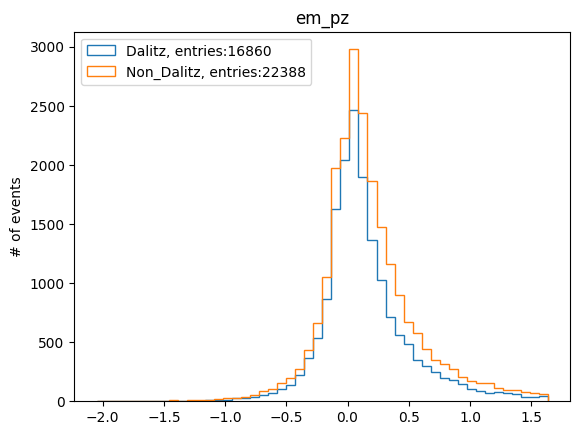

...

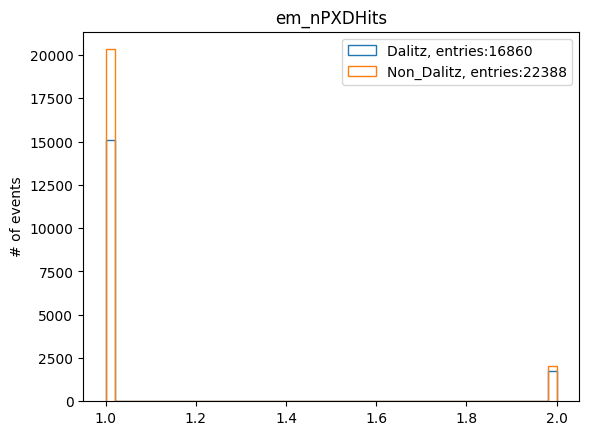

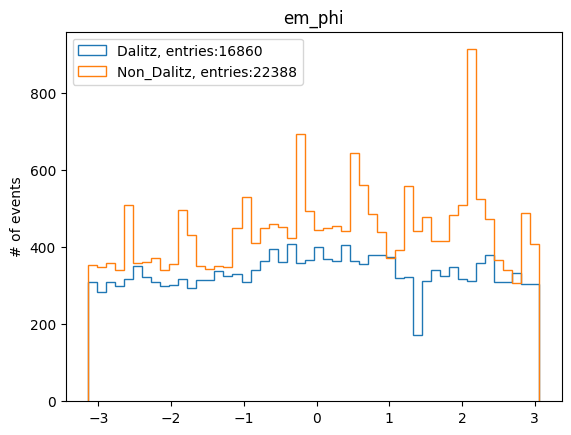

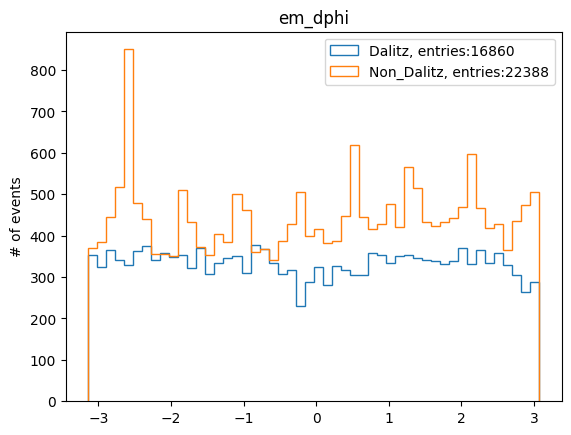

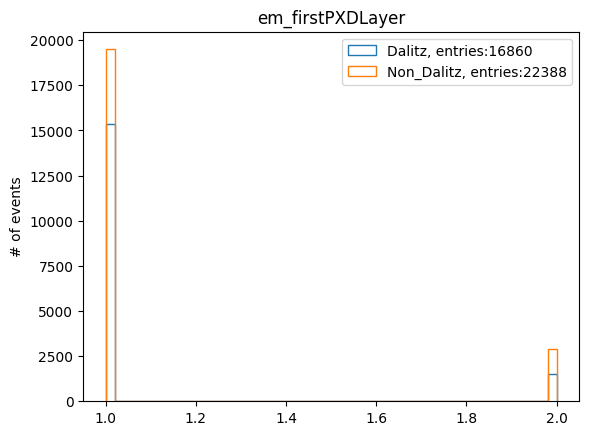

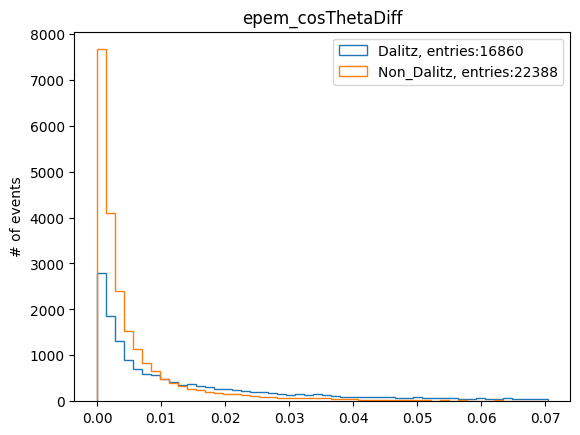

In [36]:
feature_plot(em_data)

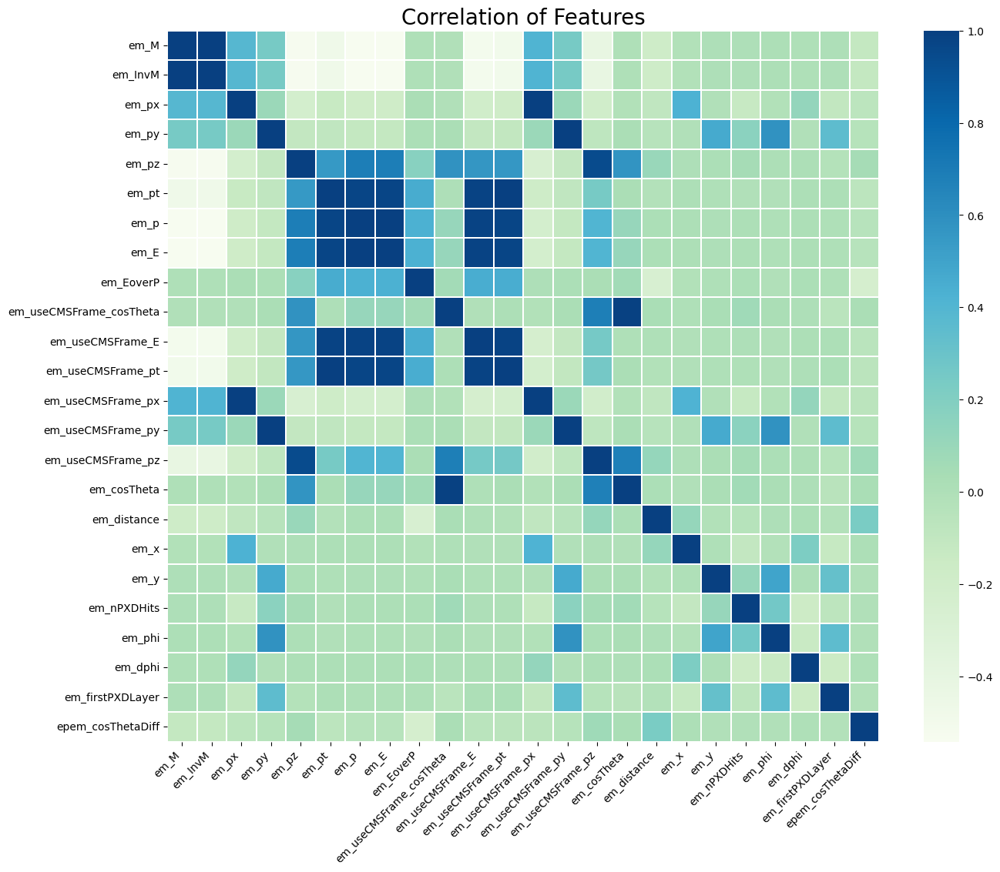

In [37]:
comax(em_data)

## gamma (photon)

In [38]:
mask = data.columns.str.contains('gamma')
gamma_data = data.iloc[:,mask]

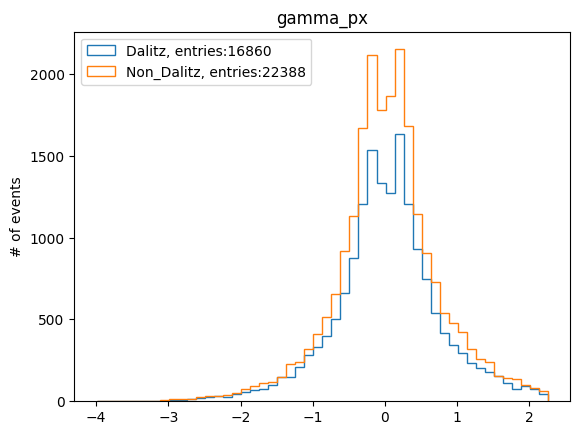

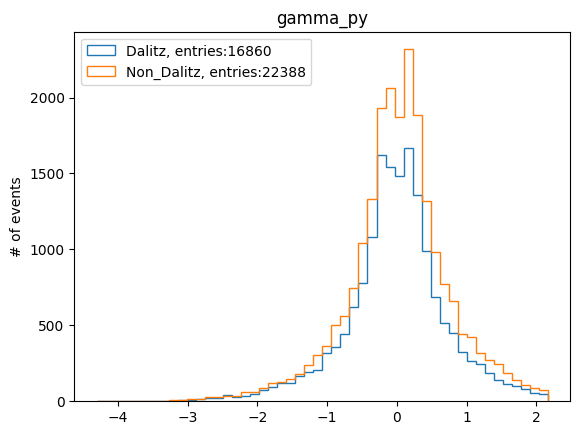

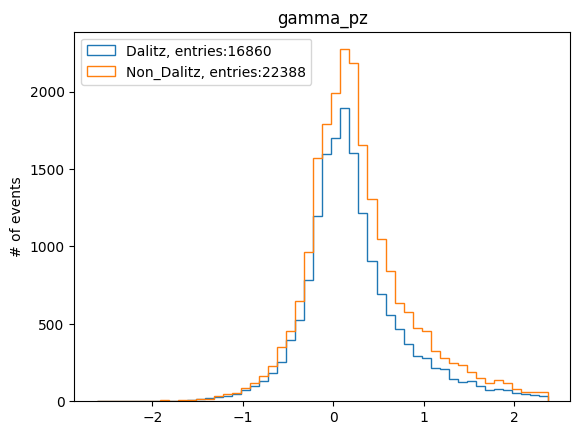

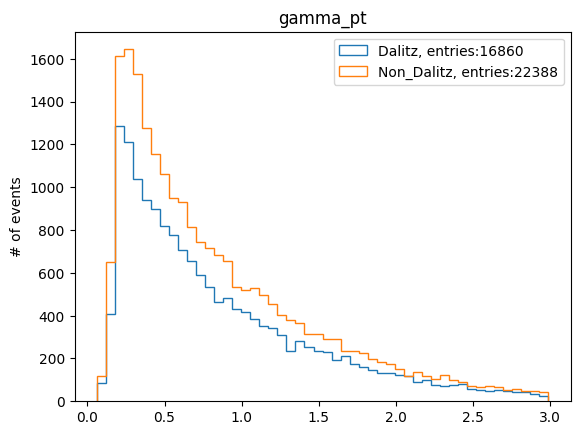

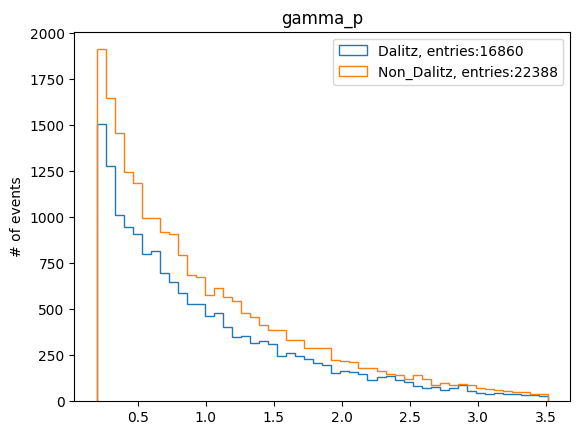

...

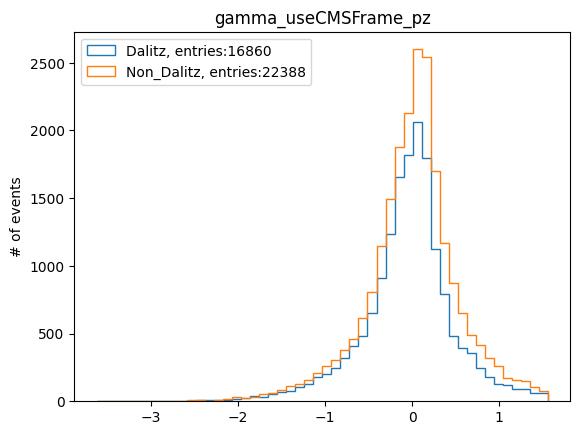

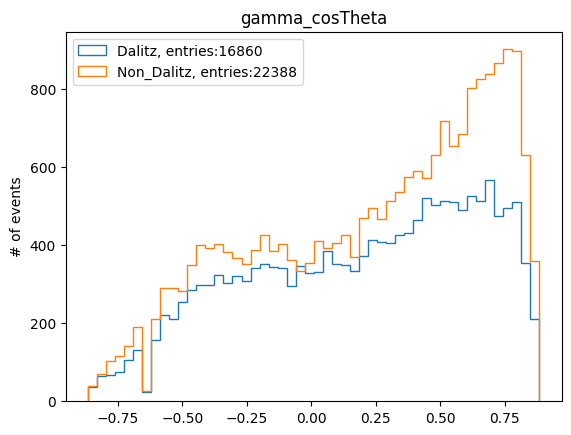

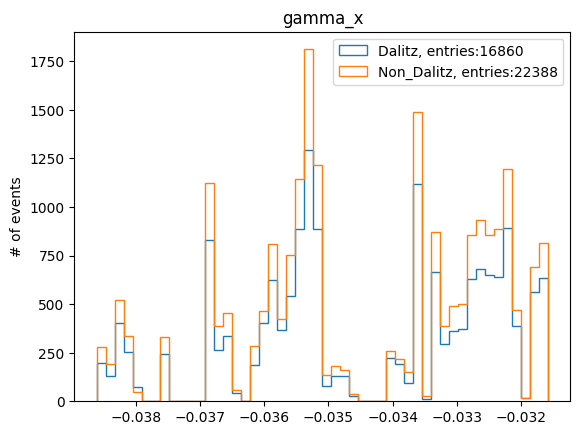

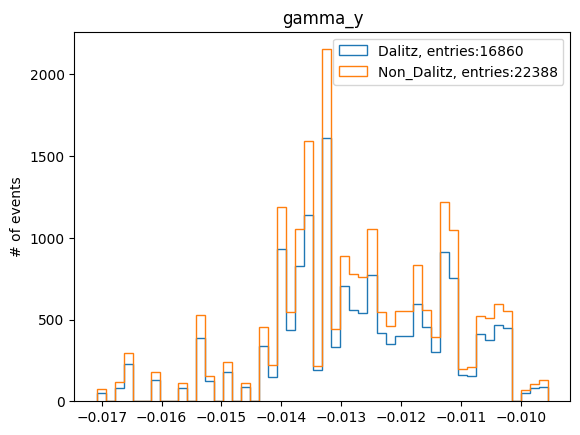

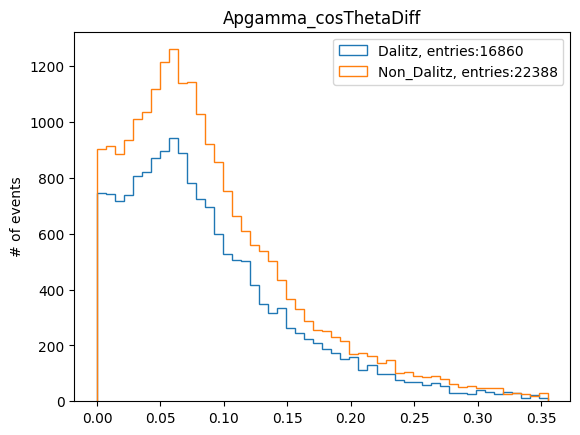

In [39]:
feature_plot(gamma_data)

## Bad values with small varaince

In [40]:
gamma_data[["gamma_clusterEoP"]].describe()

,gamma_clusterEoP
count,3.924800e+04
mean,1.000000e+00
std,1.025737e-16
min,1.000000e+00
25%,1.000000e+00
50%,1.000000e+00
75%,1.000000e+00
max,1.000000e+00


In [41]:
gamma_data[["gamma_EoverP"]].describe()

,gamma_EoverP
count,3.924800e+04
mean,1.000000e+00
std,1.025737e-16
min,1.000000e+00
25%,1.000000e+00
50%,1.000000e+00
75%,1.000000e+00
max,1.000000e+00


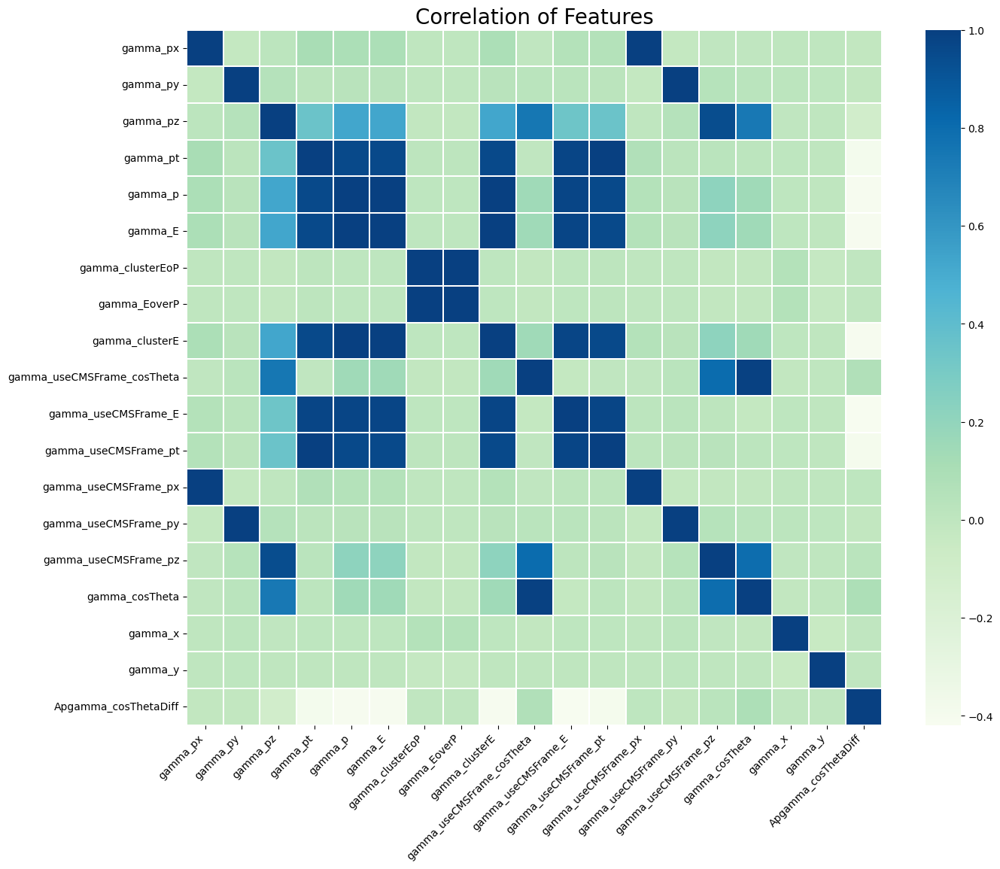

In [42]:
comax(gamma_data)

## drop gamma_EoverP and gamma_clusterEoP

In [43]:
data = data.drop(columns = ["gamma_EoverP","gamma_clusterEoP"])

In [44]:
mask = data.columns.str.contains('pi0')
pi0_data = data.iloc[:,mask]

## pi0 $(\pi^0)$

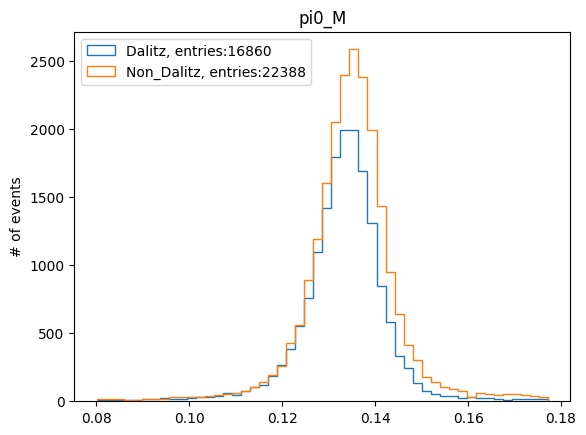

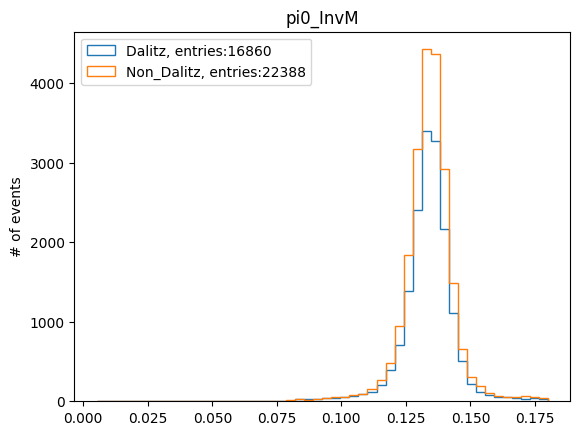

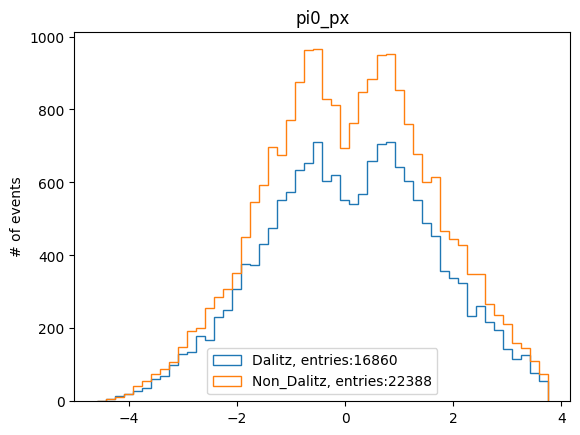

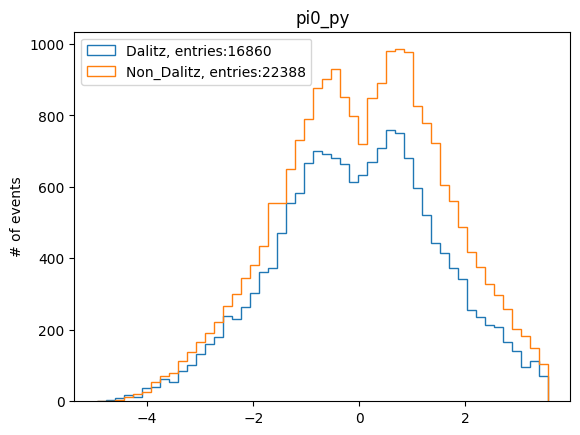

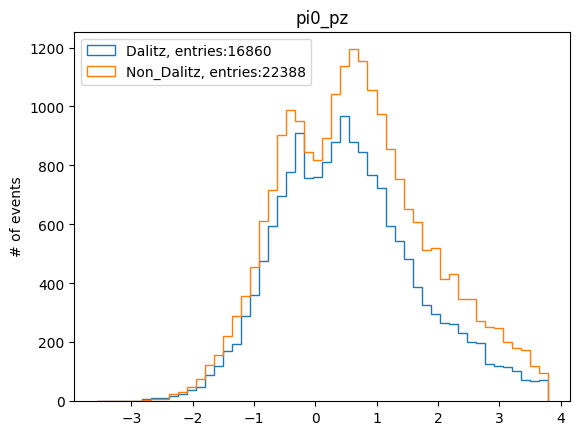

...

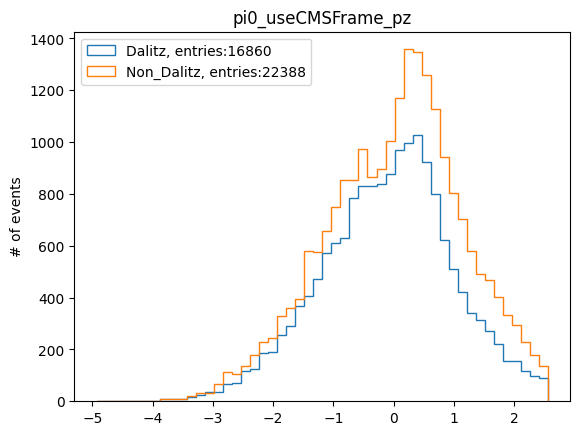

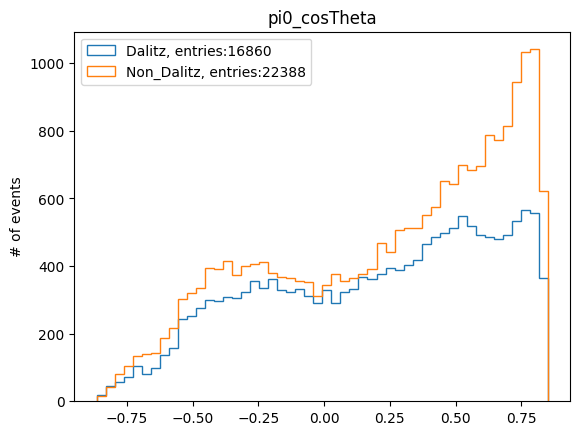

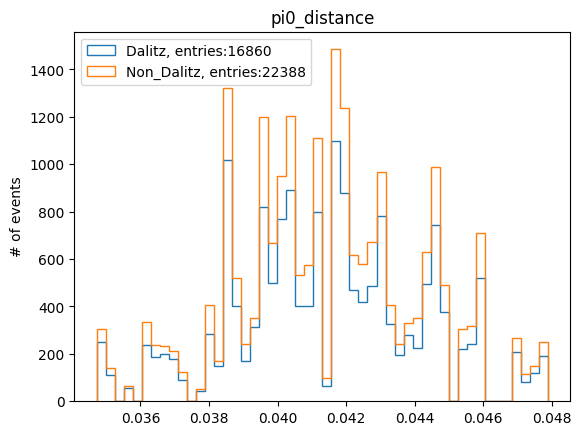

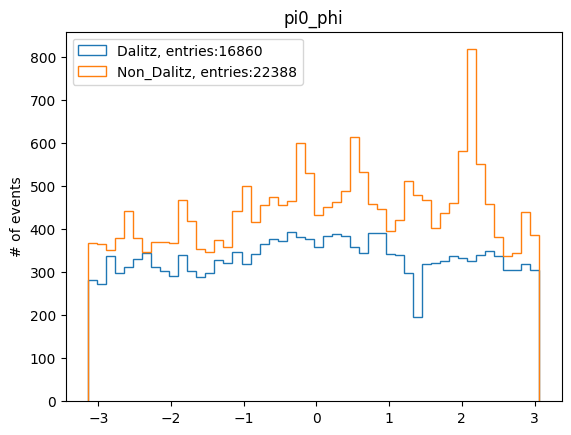

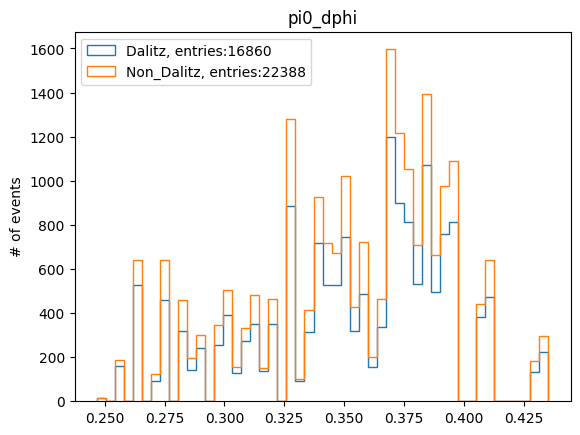

In [45]:
feature_plot(pi0_data)

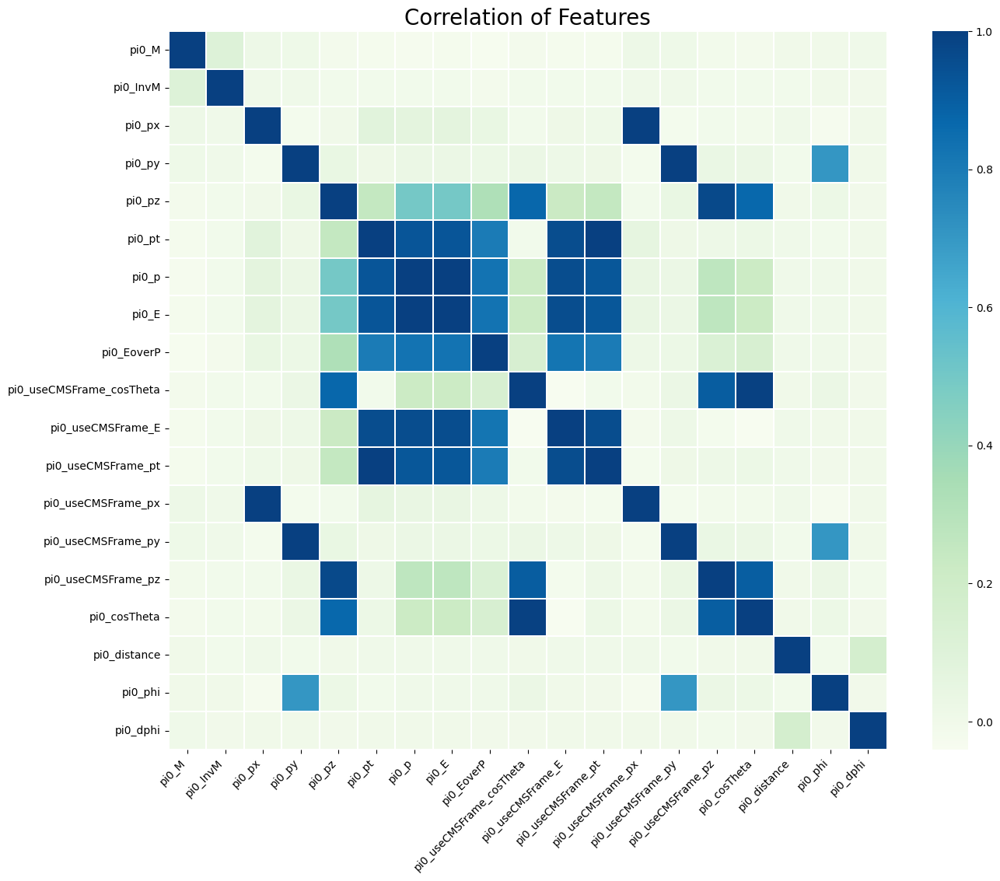

In [46]:
comax(pi0_data)

## vertical reconstruction (difference between angles)

In [47]:
ot_data =  data[["phidiff","dphidiff"]]

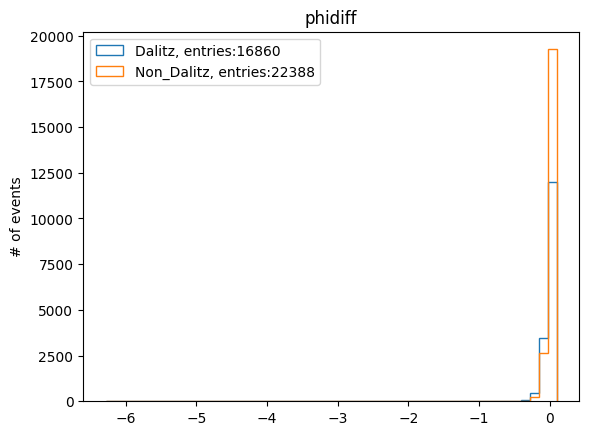

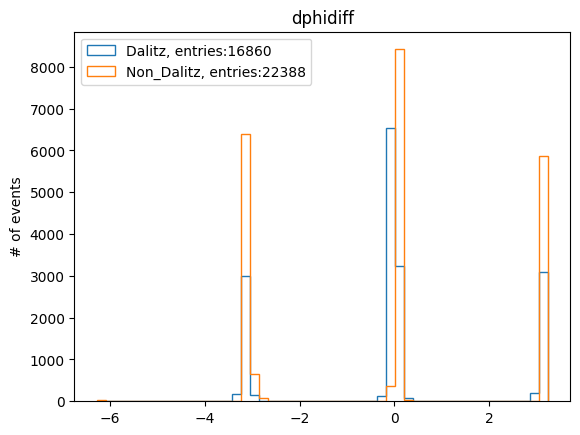

In [48]:
feature_plot(ot_data)

## Make plot for showing the transverse displacement of Ap_vertex

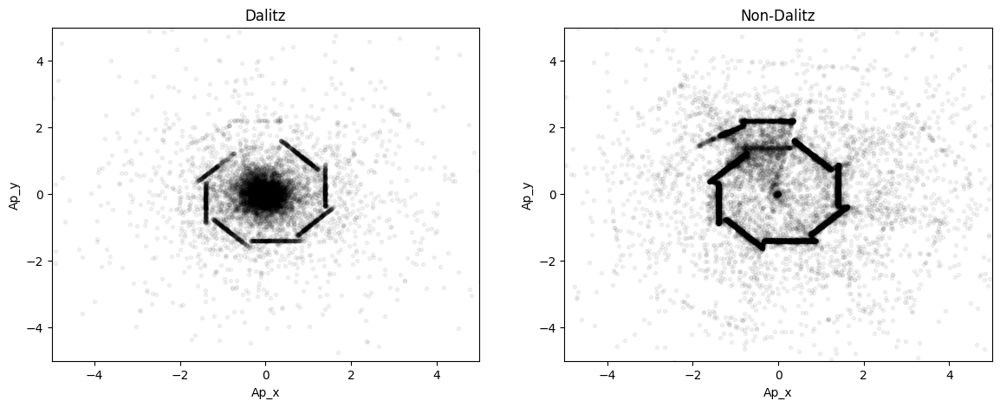

In [49]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(data[["Ap_x"]].values[idx],data[["Ap_y"]].values[idx],'k.',alpha = 0.05)
plt.title('Dalitz')
plt.xlabel('Ap_x')
plt.ylabel('Ap_y')
plt.xlim(-5,5)
plt.ylim(-5,5)

plt.subplot(1,2,2)
plt.plot(data[["Ap_x"]].values[nidx],data[["Ap_y"]].values[nidx],'k.',alpha = 0.05)
plt.xlabel('Ap_x')
plt.ylabel('Ap_y')
plt.xlim(-5,5)
plt.ylim(-5,5)
plt.title('Non-Dalitz')
plt.show()

## show cleaned data info

In [50]:
data.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39248 entries, 0 to 39247
Data columns (total 139 columns):
 #    Column                                       Non-Null Count  Dtype  
---   ------                                       --------------  -----  
 0    Ap_convertedPhotonDelR_0_1                   39248 non-null  float64
 1    Ap_convertedPhotonDelTanLambda_0_1           39248 non-null  float64
 2    Ap_convertedPhotonDelZ_0_1                   39248 non-null  float64
 3    Ap_convertedPhotonInvariantMass_0_1          39248 non-null  float64
 4    Ap_convertedPhotonPx_0_1                     39248 non-null  float64
 5    Ap_convertedPhotonPy_0_1                     39248 non-null  float64
 6    Ap_convertedPhotonPz_0_1                     39248 non-null  float64
 7    Ap_convertedPhotonRho_0_1                    39248 non-null  float64
 8    Ap_convertedPhotonX_0_1                      39248 non-null  float64
 9    Ap_convertedPhotonY_0_1                      39248 non-null

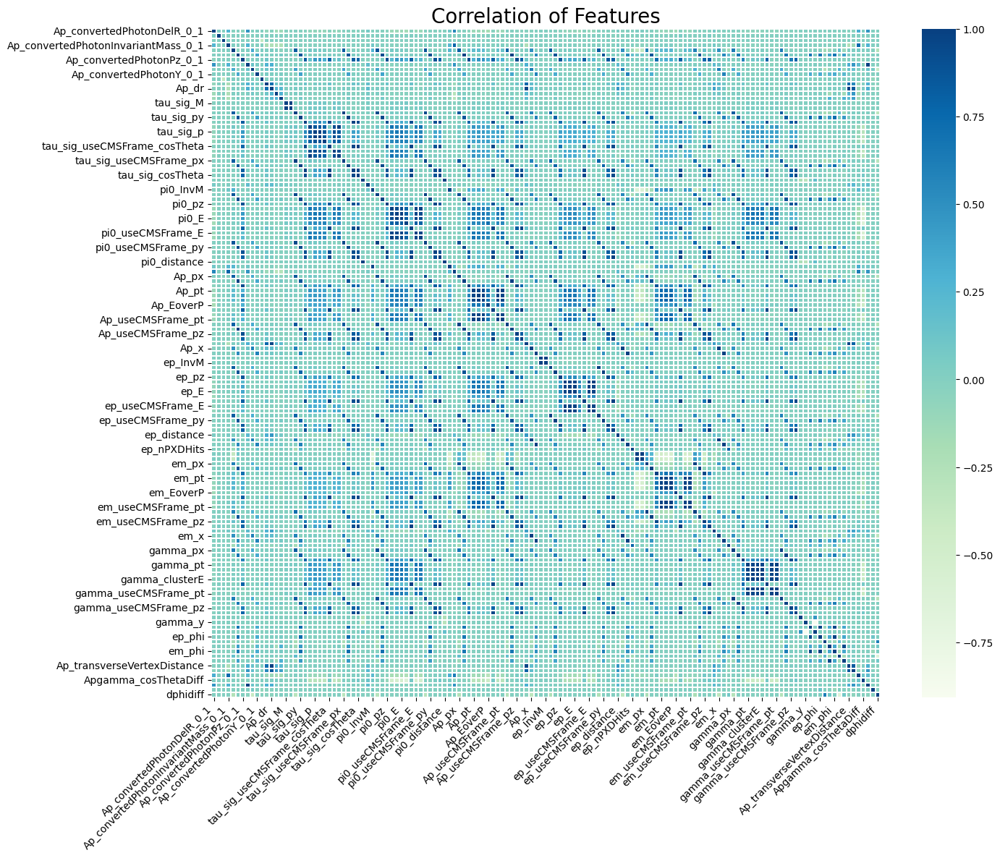

In [51]:
comax(data)

## Cleaned data

In [52]:
X = data.values

In [53]:
X.shape

(39248, 139)

## Generate labels: 1 for dalitz and 0 for non-dalitz

In [54]:
Y = np.array([0]*len(X))
Y[idx] = 1

## Random sampling to make dalitz and non-dalitz balanced

In [55]:
x,y = NearMiss().fit_resample(X,Y)

In [56]:
x.shape

(33720, 139)

In [57]:
y.shape

(33720,)

## check if sampled data is balanced

In [58]:
np.mean(y==1)

0.5

## Split dataset into training and test, due to the size of data, 5% used for the test

## This dataset will be preserved to make sure all models have the same training and the testset. 

In [59]:
xx_train,xx_test,y_train, y_test = train_test_split(x,y,test_size = 0.05,shuffle= True)

In [60]:
xx_train.shape

(32034, 139)

In [61]:
np.mean(y_train==1)

0.4999687831678841

In [62]:
xx_test.shape

(1686, 139)

## Normalize x, standard scaler used because of the gaussian nature of these features

In [63]:
sc = StandardScaler()
x_train = sc.fit_transform(xx_train)
x_test = sc.transform(xx_test)

## functions for evaluating the model

In [64]:
def eva(y_true, y_pred):

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1-score: {f1}")

In [65]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [66]:
def prob_dist(tr_prob, te_prob):
    fig = plt.figure(figsize=(13, 9))
    plt.suptitle('Training',size =20)
    plt.subplot(2, 2, 1)
    plt.hist(tr_prob[np.where(y_train == 0)[0],1],20,color = "blue",)
    plt.legend(['Non-dalitz(Train)'])

    plt.subplot(2, 2, 2)
    plt.hist(tr_prob[np.where(y_train == 1)[0],1],20,color = "red",)
    plt.legend(['Dalitz (Train)'])
    plt.show()


    fig = plt.figure(figsize=(13, 9))
    plt.suptitle('Testing',size =20)
    plt.subplot(2, 2, 1)
    plt.hist(te_prob[np.where(y_test == 0)[0],1],20,color = "blue",)
    plt.xlim([0,1])
    plt.legend(['Non-Dalitz (Test)'])

    plt.subplot(2, 2, 2)
    plt.hist(te_prob[np.where(y_test == 1)[0],1],20,color = "red",)
    plt.xlim([0,1])
    plt.legend(['Daltiz (Test)'])
    plt.show()

# $$ \textbf{Non-parametric model: Random Forest}$$

In [67]:
RFclass = RandomForestClassifier(n_estimators = 100,criterion='gini')

RFmodel = RFclass.fit(x_train, y_train)

Py_train_prob = RFmodel.predict_proba(x_train)
Py_train = RFmodel.predict(x_train)

Py_test_prob = RFmodel.predict_proba(x_test)
Py_test = RFmodel.predict(x_test)

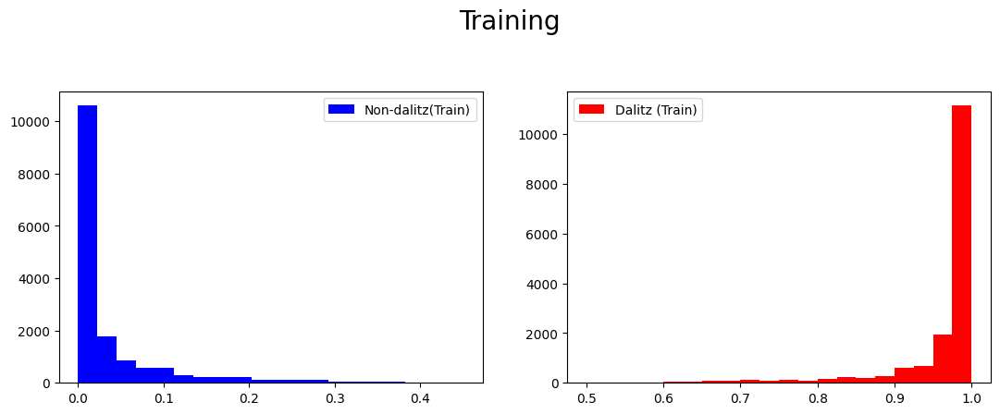

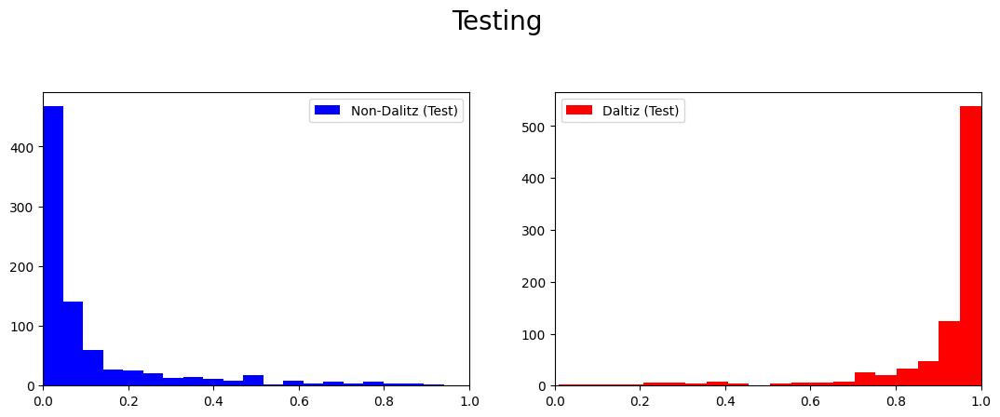

In [68]:
prob_dist(Py_train_prob, Py_test_prob)

Confusion matrix, without normalization
[[16018     0]
 [    1 16015]]


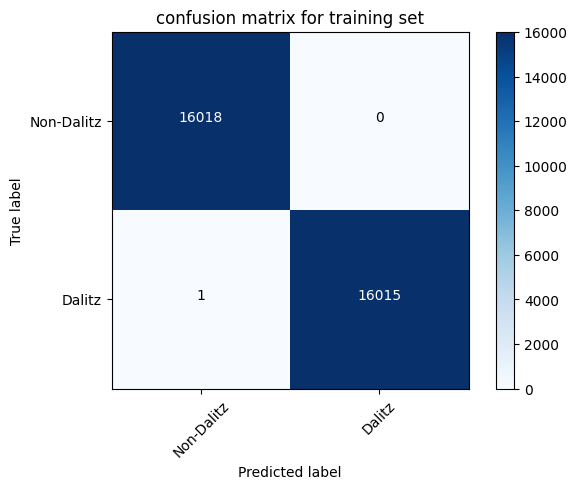

Normalized confusion matrix
[[1.00e+00 0.00e+00]
 [6.24e-05 1.00e+00]]


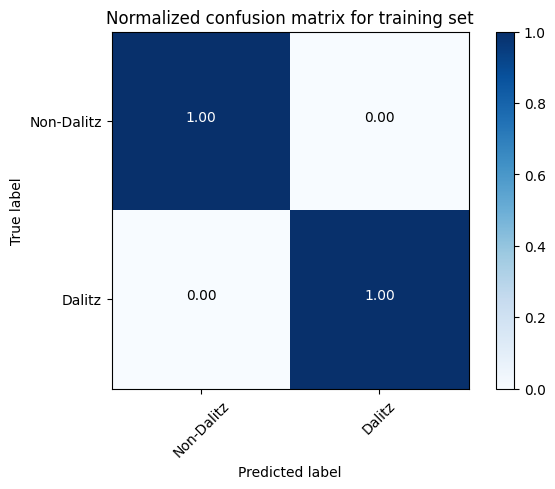

In [69]:
cnf_matrix = confusion_matrix(y_train,Py_train)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for training set')

plt.show()

Confusion matrix, without normalization
[[799  43]
 [ 36 808]]


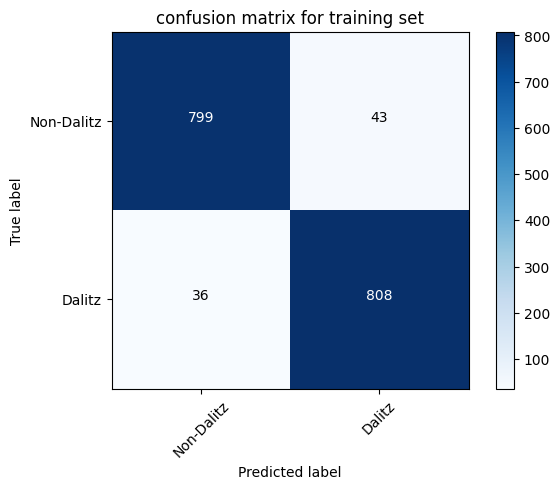

Normalized confusion matrix
[[0.95 0.05]
 [0.04 0.96]]


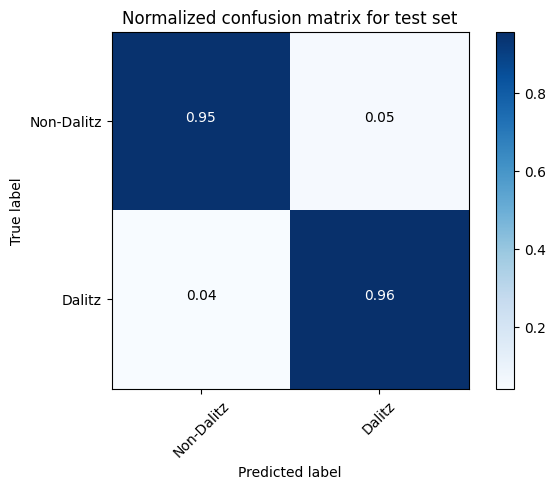

In [70]:
cnf_matrix = confusion_matrix(y_test,Py_test)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for test set')

plt.show()

In [71]:
eva(y_test,Py_test)

Accuracy: 0.9531435349940688
Precision: 0.9494712103407755
Recall: 0.957345971563981
F1-score: 0.9533923303834808


# $$ \textbf{Feauture importance} $$

In [72]:
ft = np.array(data.columns.tolist())

In [73]:
importance = pd.DataFrame(RFclass.feature_importances_)
importance = importance.set_index(ft)
importance = importance.set_axis(['weight'], axis=1)
importance = importance.sort_values(by=['weight'],ascending=False)

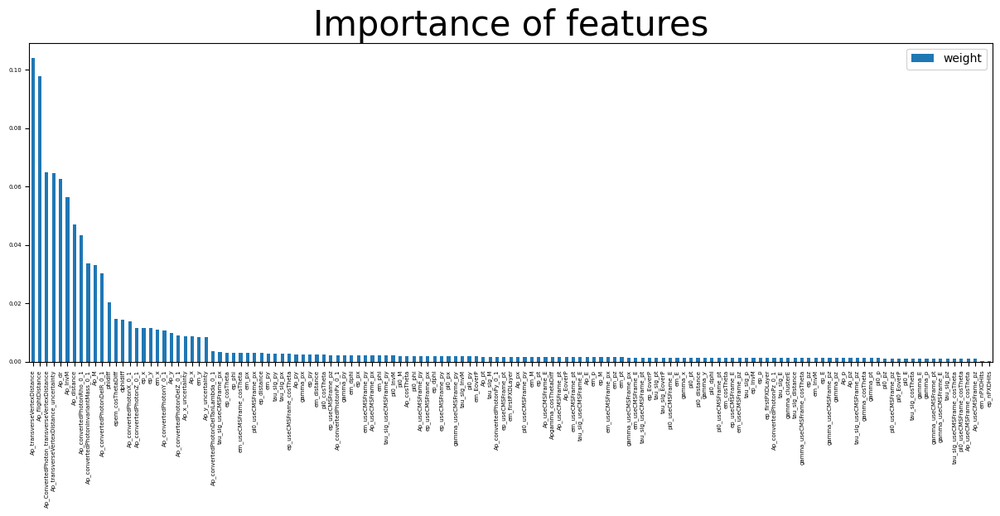

In [74]:
importance.plot(kind='bar',figsize=(15,5),fontsize = 5)
#plt.ylabel('weight',size =20)
#plt.yscale('log')
plt.title('Importance of features',size = 30)
plt.show()

# Find most important features with the highest weight with Random Forest

In [75]:
ft_r = importance.sort_values(by=['weight'],ascending=False).iloc[:30,:]

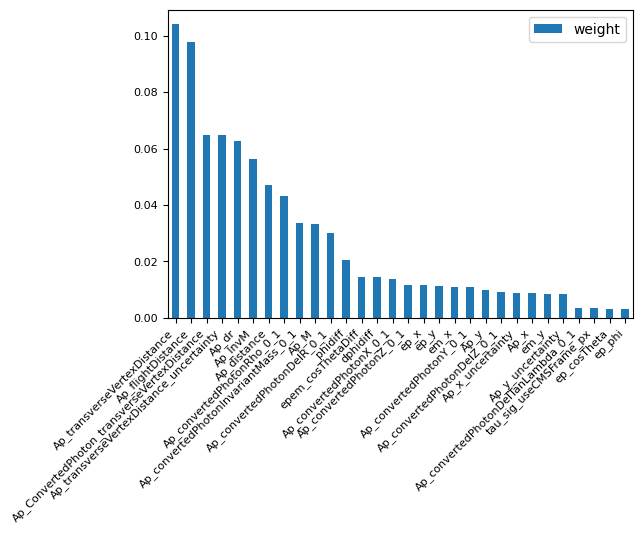

In [78]:
ft_r.plot(kind='bar',figsize=(6,4),fontsize = 8)
plt.xticks(rotation=45, ha='right')
plt.show()

## feature selection with Random Forest importance

## As the Figure above shows, there is a big drop at 27th feature and all the features have weight less than 1% beyound this point. Therefore, first 26 features are selected.

In [79]:
ft_r.index[:26]

Index(['Ap_transverseVertexDistance', 'Ap_flightDistance',
       'Ap_ConvertedPhoton_transverseVertexDistance',
       'Ap_transverseVertexDistance_uncertainty', 'Ap_dr', 'Ap_InvM',
       'Ap_distance', 'Ap_convertedPhotonRho_0_1',
       'Ap_convertedPhotonInvariantMass_0_1', 'Ap_M',
       'Ap_convertedPhotonDelR_0_1', 'phidiff', 'epem_cosThetaDiff',
       'dphidiff', 'Ap_convertedPhotonX_0_1', 'Ap_convertedPhotonZ_0_1',
       'ep_x', 'ep_y', 'em_x', 'Ap_convertedPhotonY_0_1', 'Ap_y',
       'Ap_convertedPhotonDelZ_0_1', 'Ap_x_uncertainty', 'Ap_x', 'em_y',
       'Ap_y_uncertainty'],
      dtype='object')

In [80]:
ridx= data.columns.get_indexer(ft_r.index[:26])

In [81]:
ridx.sort()

In [82]:
data_r = data.iloc[:,ridx]

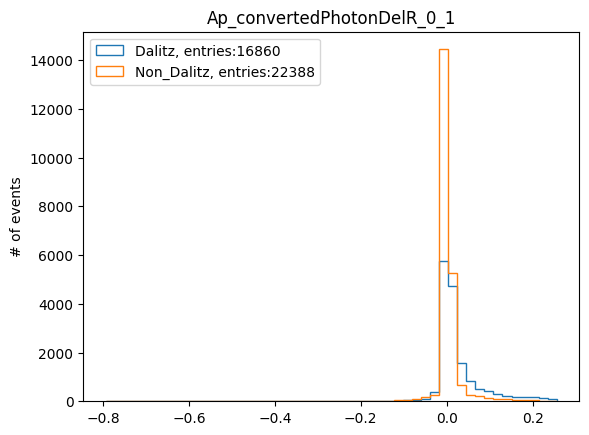

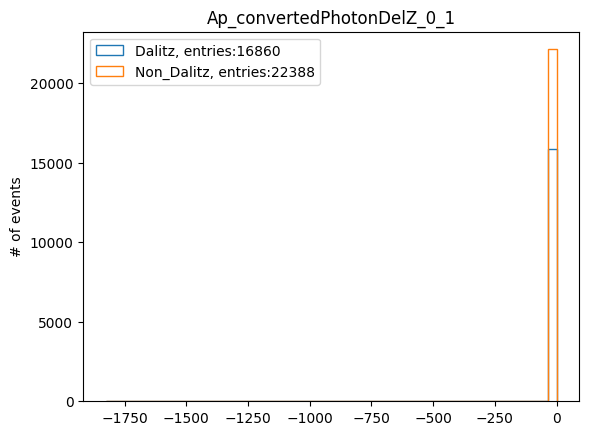

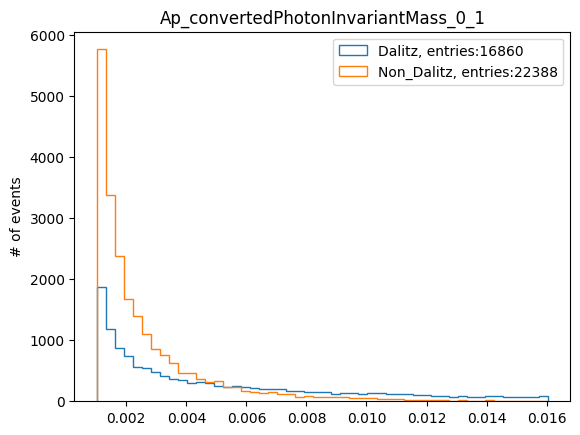

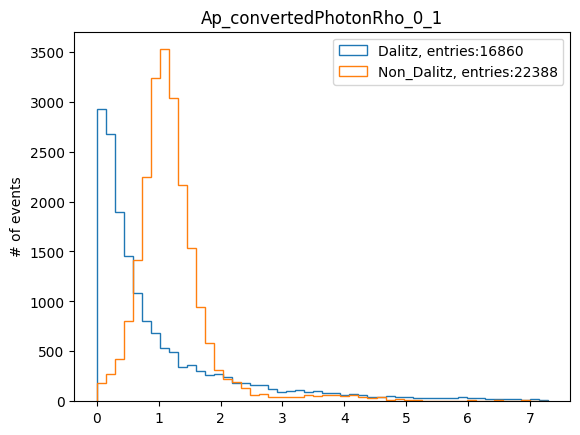

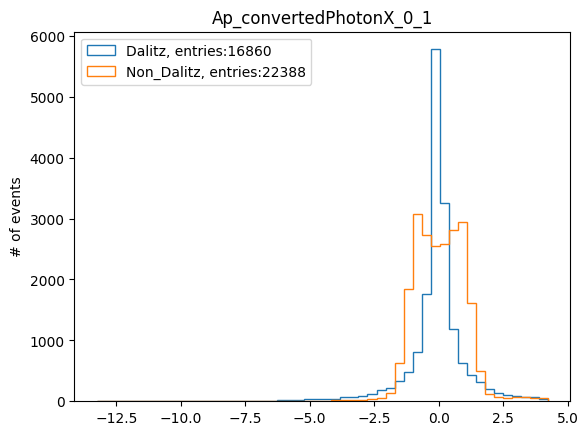

...

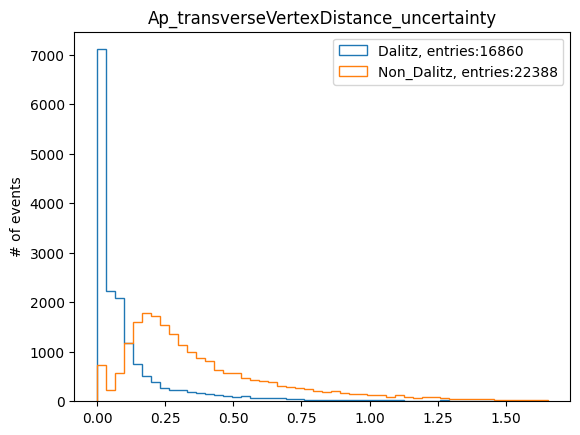

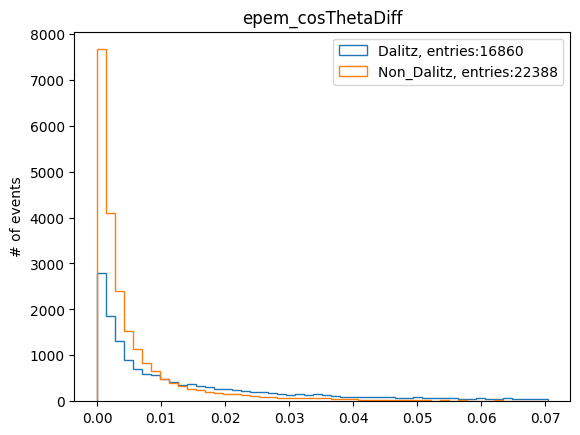

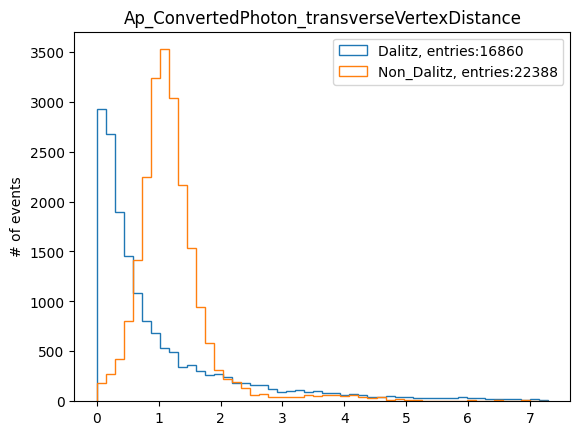

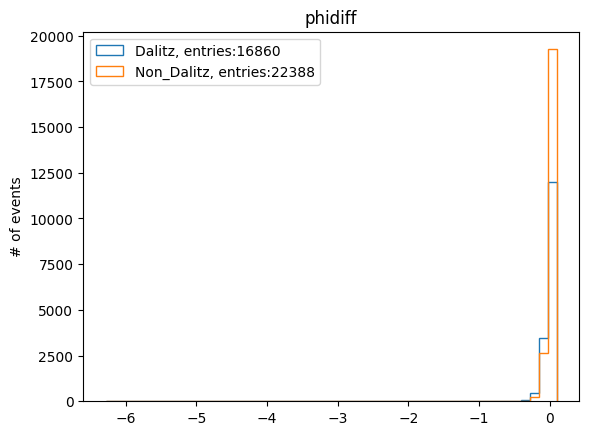

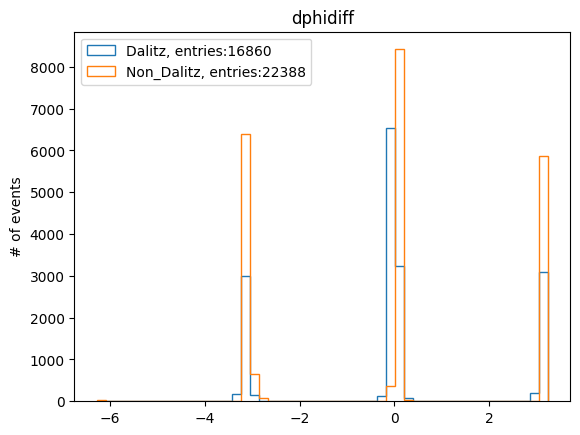

In [83]:
feature_plot(data_r)

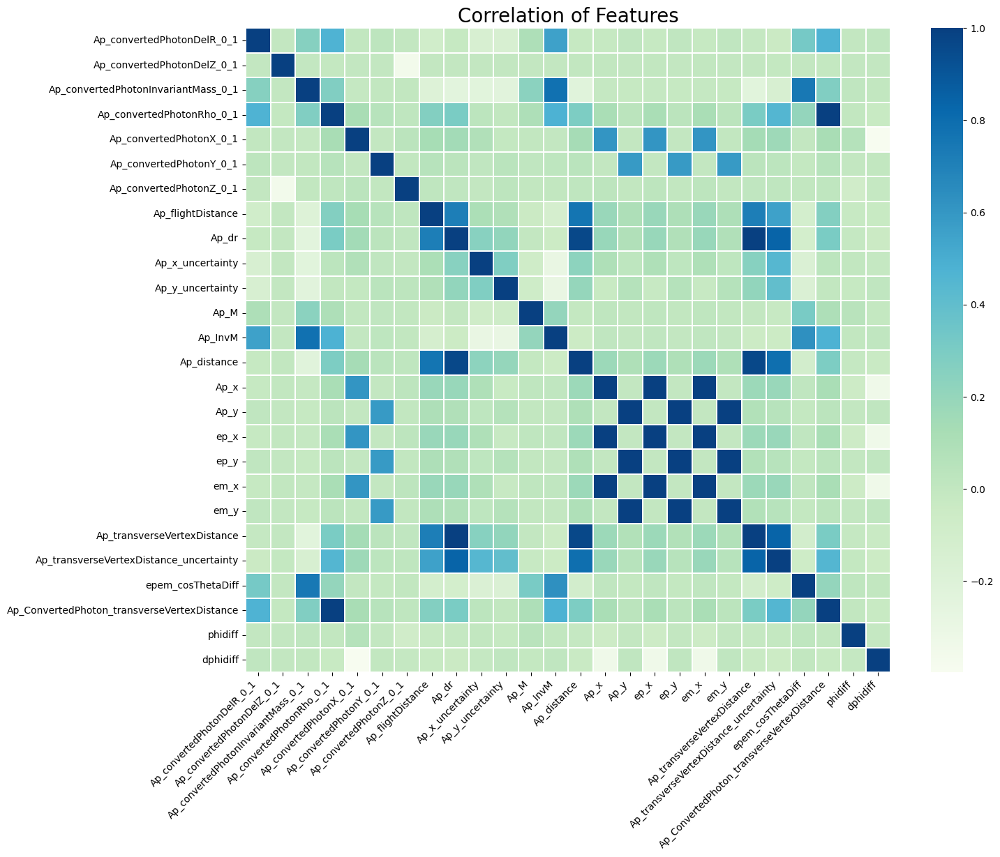

In [84]:
comax(data_r)

## Find most importance features by dropping the column with the highest weight 

In [86]:
def drop_ft(x_train, x_test, y_train, y_test, n_features=30):

    mft = []
    current_features = data.columns.tolist()
    x_train = pd.DataFrame(x_train, columns=current_features)
    x_test = pd.DataFrame(x_test, columns=current_features)

    for _ in range(n_features):
        # Initialize and train a Random Forest Classifier
        RFclass = RandomForestClassifier(n_estimators=100, criterion='gini')
        RFclass.fit(x_train[current_features], y_train)

        # Get feature importances
        importances = RFclass.feature_importances_

        # Find the most important feature
        midx = np.argmax(importances)
        mim = current_features[midx]

        # Remove the most important feature from the list
        current_features.remove(mim)

        # Add the dropped feature to the important_features list
        mft.append(mim)

    return mft

In [87]:
ft_c = drop_ft(x_train, x_test, y_train, y_test)

In [88]:
np.array(ft_c)

array(['Ap_flightDistance', 'Ap_dr', 'Ap_transverseVertexDistance',
       'Ap_distance', 'Ap_ConvertedPhoton_transverseVertexDistance',
       'Ap_convertedPhotonRho_0_1',
       'Ap_transverseVertexDistance_uncertainty', 'Ap_InvM',
       'Ap_convertedPhotonInvariantMass_0_1', 'Ap_M', 'em_x',
       'Ap_convertedPhotonDelR_0_1', 'ep_x', 'Ap_x', 'epem_cosThetaDiff',
       'Ap_convertedPhotonDelZ_0_1', 'Ap_y', 'em_y', 'ep_y', 'dphidiff',
       'Ap_convertedPhotonZ_0_1', 'Ap_convertedPhotonX_0_1',
       'Ap_convertedPhotonY_0_1', 'phidiff',
       'Ap_convertedPhotonDelTanLambda_0_1', 'Ap_x_uncertainty',
       'Ap_y_uncertainty', 'ep_dphi', 'em_dphi', 'pi0_M'], dtype='<U43')

## select first 26 features

In [218]:
fidx= data.columns.get_indexer(ft_c[:26])
fidx.sort()

In [219]:
data_c = data.iloc[:,fidx]

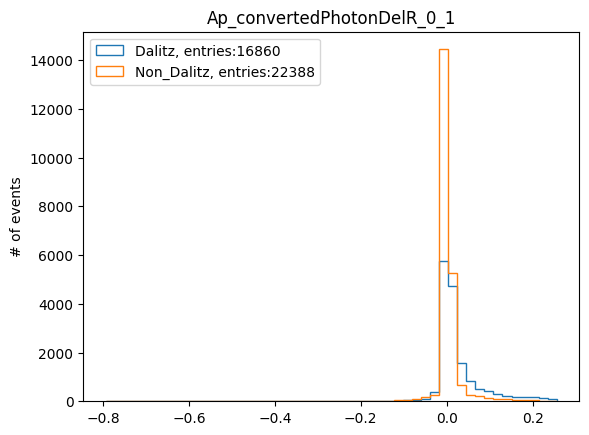

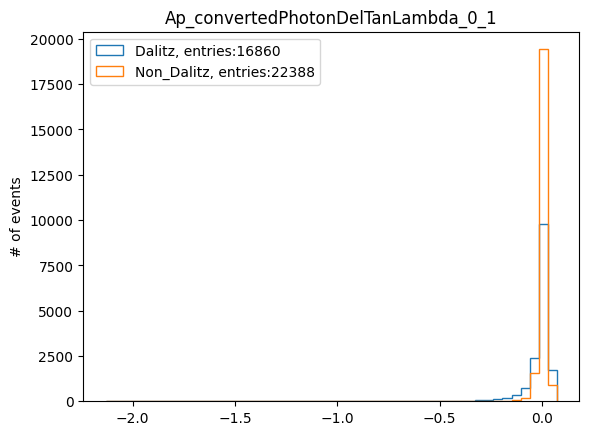

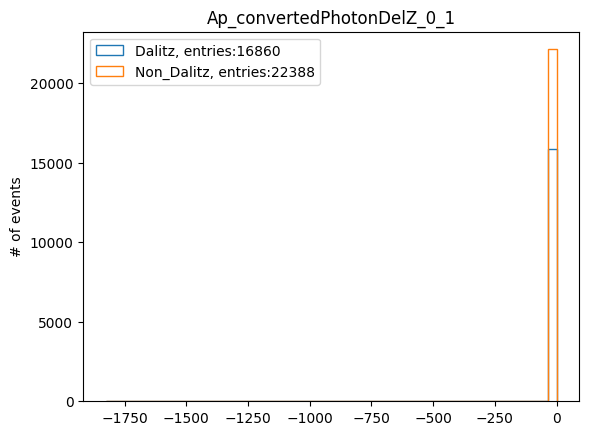

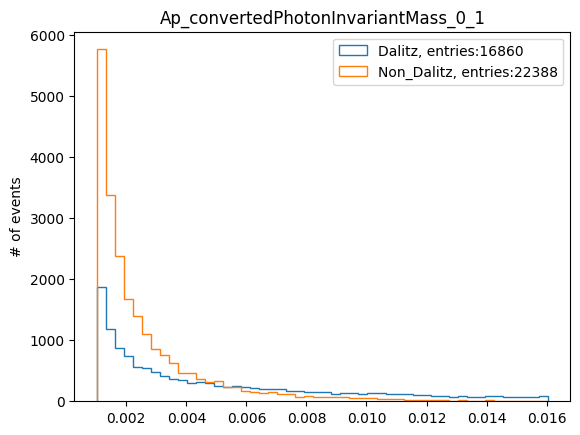

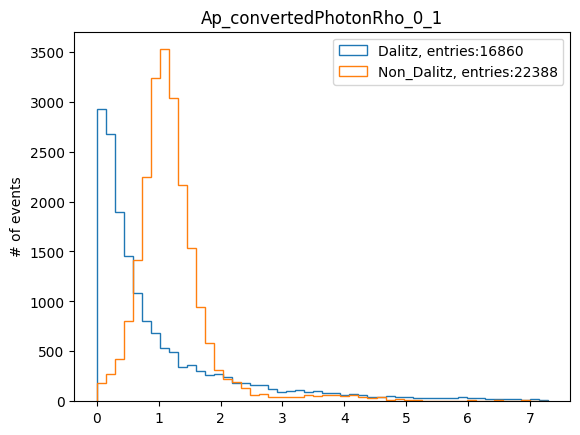

...

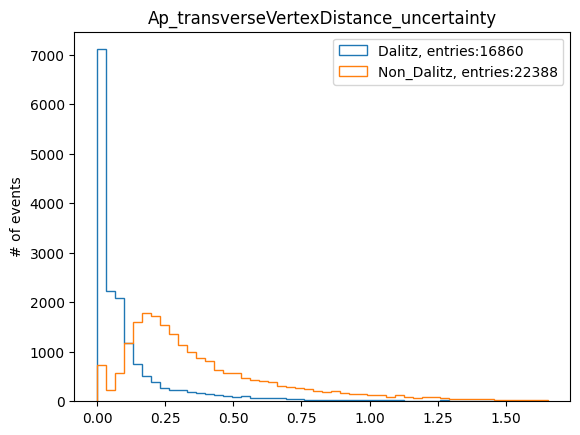

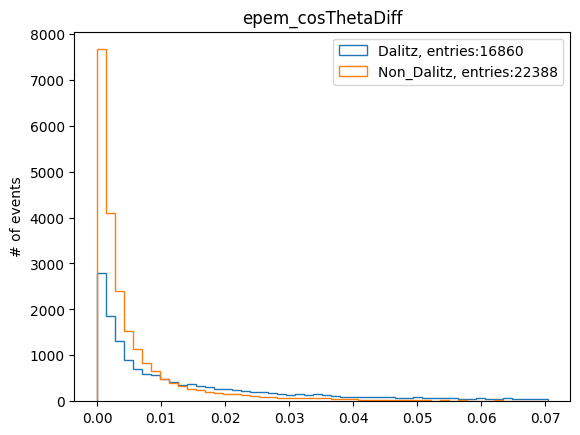

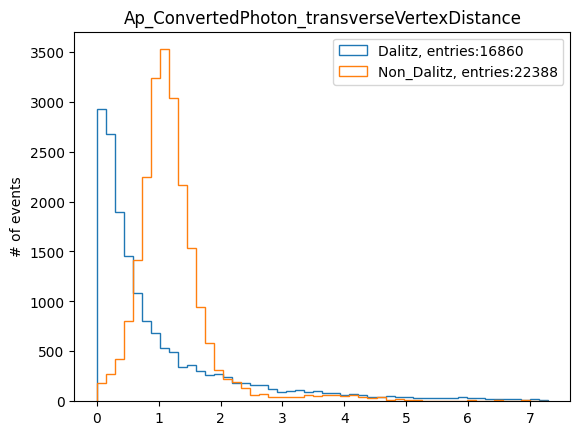

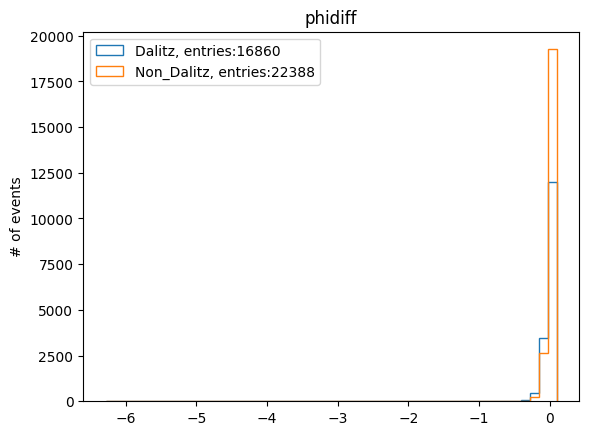

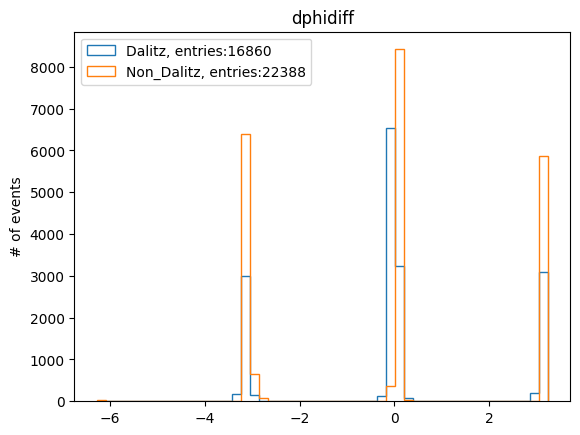

In [220]:
feature_plot(data_c)

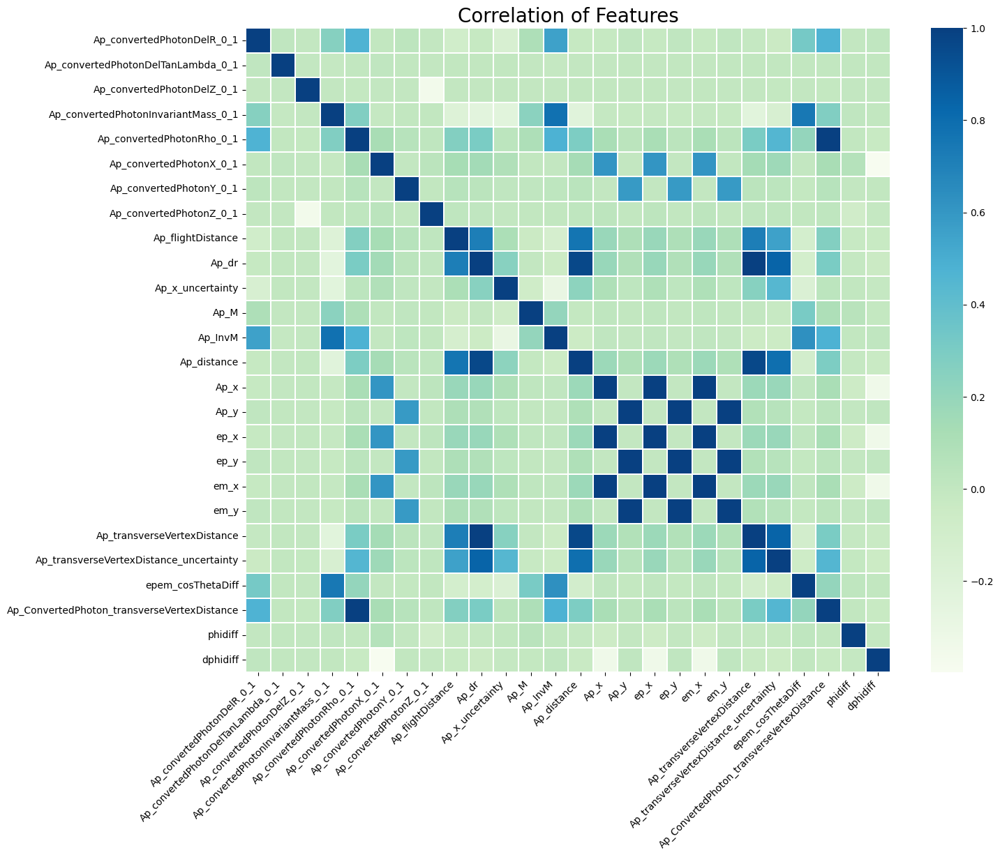

In [221]:
comax(data_c)

## Generate training and test set with selectd features determined by  RF importances  denoted as r

In [94]:
x_train_r = x_train[:,ridx]
x_test_r = x_test[:,ridx]

## Generate training and test set with selectd features determined by  RF importances with column dropping denoted as c

In [222]:
x_train_c = x_train[:,fidx]
x_test_c = x_test[:,fidx]

## Re-train Random Forest with selected features

## Feature selection without column dropping (RFclass_r)

In [96]:
RFclass = RandomForestClassifier(n_estimators = 100,criterion='gini')

RFmodel_r = RFclass.fit(x_train_r, y_train)

Py_train_prob_r = RFmodel_r.predict_proba(x_train_r)
Py_train_r = RFmodel_r.predict(x_train_r)

Py_test_prob_r = RFmodel_r.predict_proba(x_test_r)
Py_test_r = RFmodel_r.predict(x_test_r)

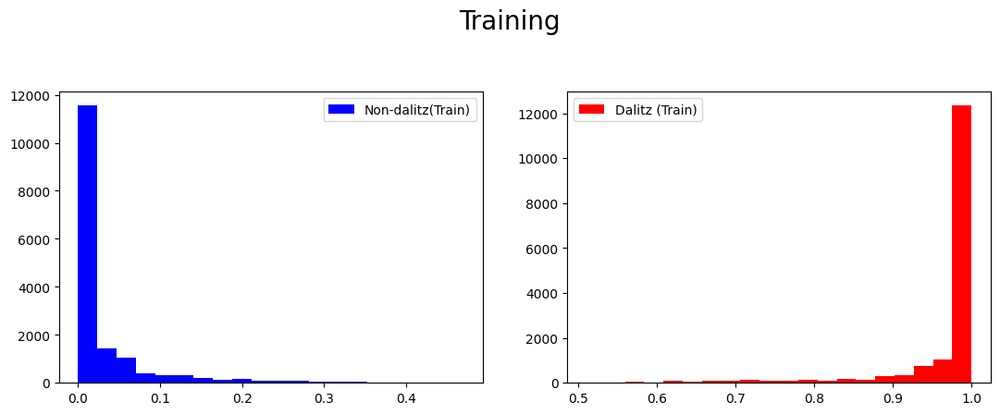

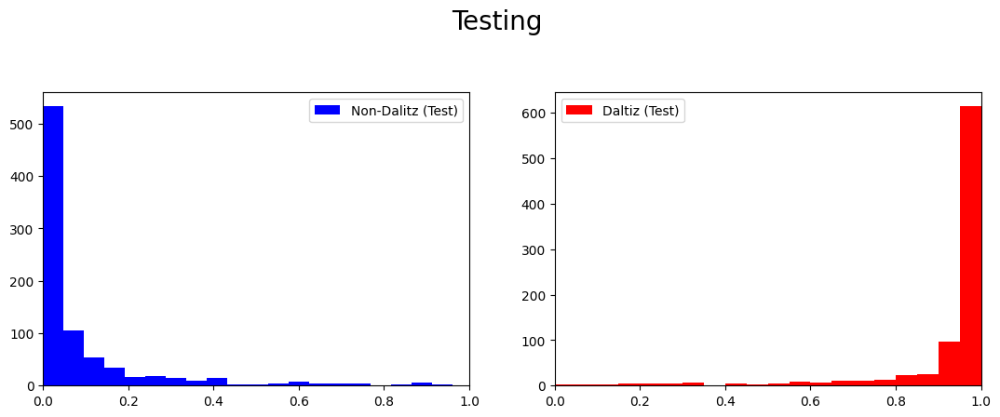

In [97]:
prob_dist(Py_train_prob_r, Py_test_prob_r)

Confusion matrix, without normalization
[[16018     0]
 [    0 16016]]


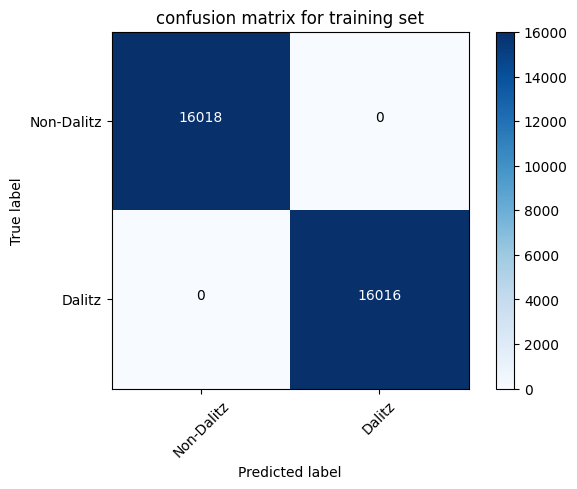

Normalized confusion matrix
[[1. 0.]
 [0. 1.]]


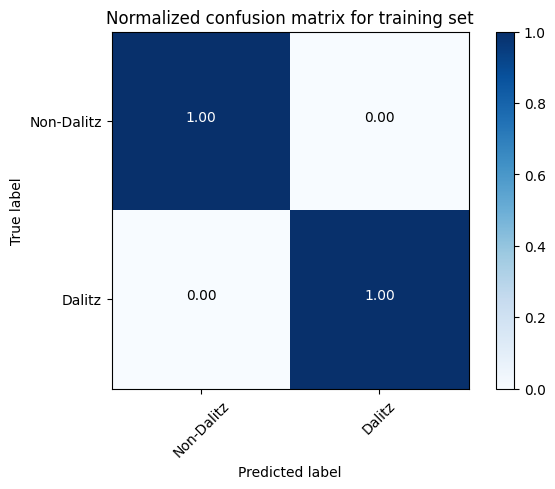

In [98]:
cnf_matrix = confusion_matrix(y_train,Py_train_r)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for training set')

plt.show()

Confusion matrix, without normalization
[[806  36]
 [ 34 810]]


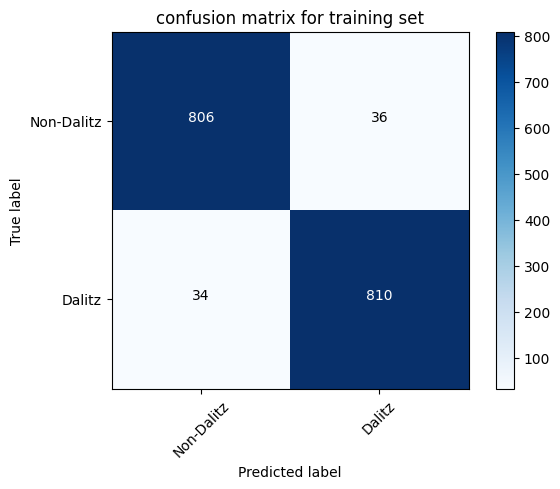

Normalized confusion matrix
[[0.96 0.04]
 [0.04 0.96]]


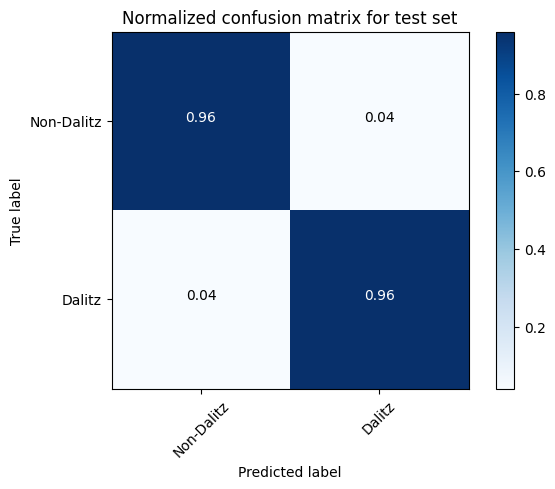

In [99]:
cnf_matrix = confusion_matrix(y_test,Py_test_r)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for test set')

plt.show()

In [100]:
eva(y_test,Py_test_r)

Accuracy: 0.9584816132858838
Precision: 0.9574468085106383
Recall: 0.9597156398104265
F1-score: 0.9585798816568047


## Feature selection with column dropping in Random Forest (RFclass_c)

In [223]:
RFclass = RandomForestClassifier(n_estimators = 100,criterion='gini')

RFmodel_c = RFclass.fit(x_train_c, y_train)

Py_train_prob_c = RFmodel_c.predict_proba(x_train_c)
Py_train_c = RFmodel_c.predict(x_train_c)

Py_test_prob_c = RFmodel_c.predict_proba(x_test_c)
Py_test_c = RFmodel_c.predict(x_test_c)

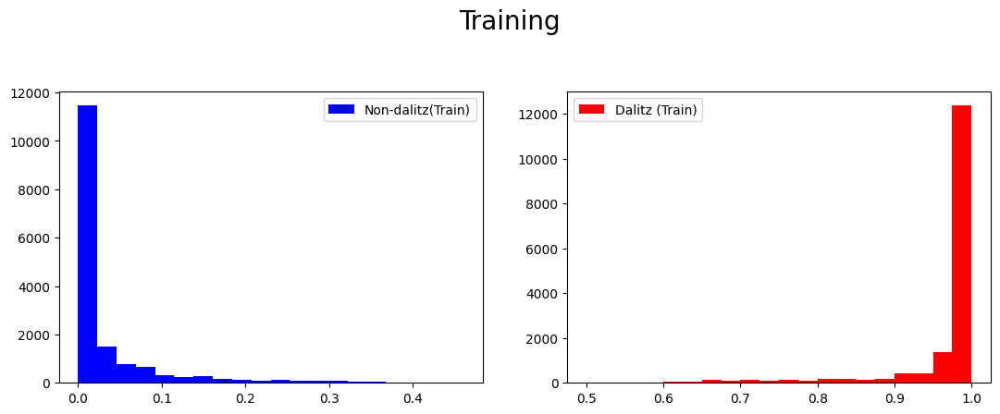

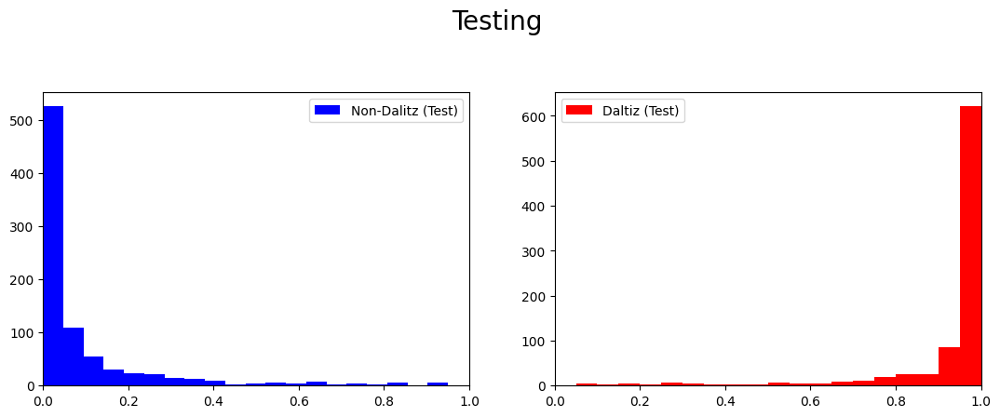

In [224]:
prob_dist(Py_train_prob_c, Py_test_prob_c)

Confusion matrix, without normalization
[[16018     0]
 [    1 16015]]


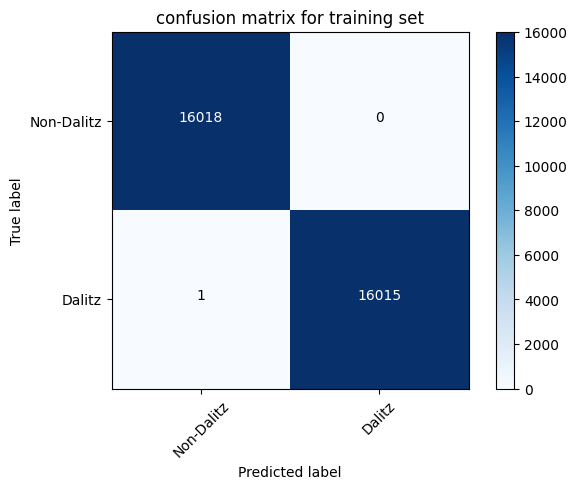

Normalized confusion matrix
[[1.00e+00 0.00e+00]
 [6.24e-05 1.00e+00]]


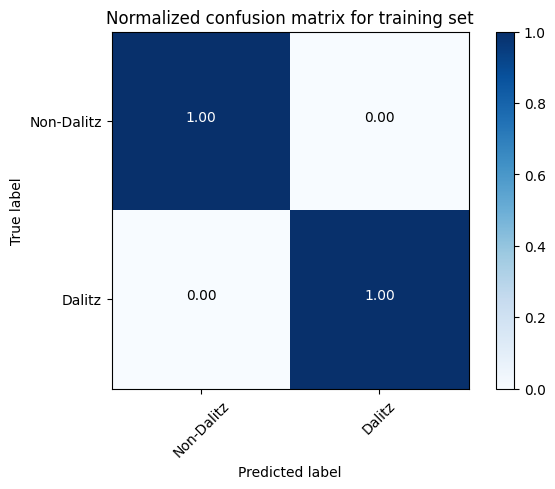

In [225]:
cnf_matrix = confusion_matrix(y_train,Py_train_c)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for training set')

plt.show()

Confusion matrix, without normalization
[[803  39]
 [ 34 810]]


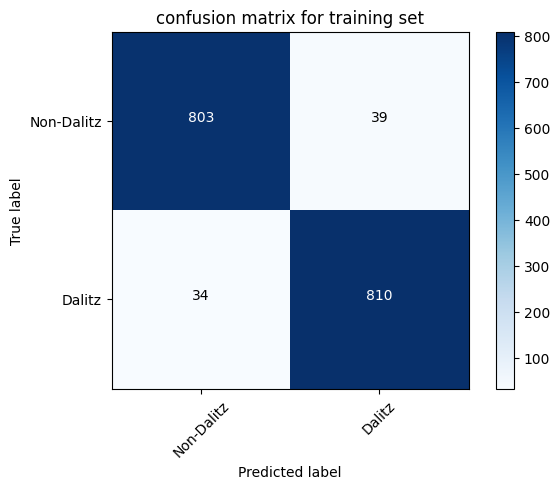

Normalized confusion matrix
[[0.95 0.05]
 [0.04 0.96]]


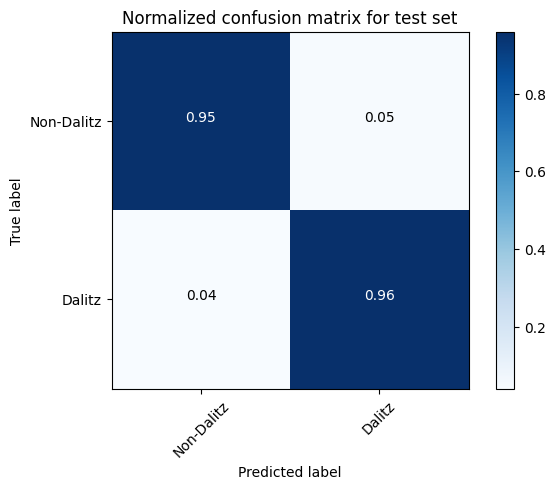

In [226]:
cnf_matrix = confusion_matrix(y_test,Py_test_c)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for test set')

plt.show()

In [227]:
eva(y_test,Py_test_c)

Accuracy: 0.9567022538552787
Precision: 0.9540636042402827
Recall: 0.9597156398104265
F1-score: 0.9568812758417011


## Functions for making plots

In [106]:
# a function for plotting performance of training and validation sets

class PlotLosses(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.losses = []
        self.val_losses = []

        self.fig = plt.figure()

        self.logs = []

    def on_epoch_end(self, epoch, logs={}):

        self.logs.append(logs)
        self.x.append(self.i+1)
        self.losses.append(logs.get('accuracy'))
        self.val_losses.append(logs.get('val_accuracy'))
        self.i += 1

        clear_output(wait=True)
        plt.plot(self.x, self.losses, label="train")
        plt.plot(self.x, self.val_losses, label="validation",linestyle='--')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.show();

plot_losses = PlotLosses()


In [107]:
def ml_plot(history):

# Plot training and validation accuracy and loss
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

# Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='best')
    plt.title('Training and Validation Accuracy')

# Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='best')
    plt.title('Training and Validation Loss')
    plt.show()

# $$ \textbf{Parametric model: ANN}$$

## ANN model without feature selection

In [122]:
inputs = Input(shape=(x_train.shape[1],))

x = Dense(128, activation='relu')(inputs)
x = Dropout(0.4)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='relu')(x)

outputs = Dense(1, activation='sigmoid')(x)

model = Model(inputs=inputs, outputs=outputs)

opt = optimizers.Adam(learning_rate=0.002)
model.compile(optimizer= opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [123]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 139)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │          17,920 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,289 (110.50 KB)

 Trainable params: 28,289 (110.50 KB)

 Non-trainable params: 0 (0.00 B)

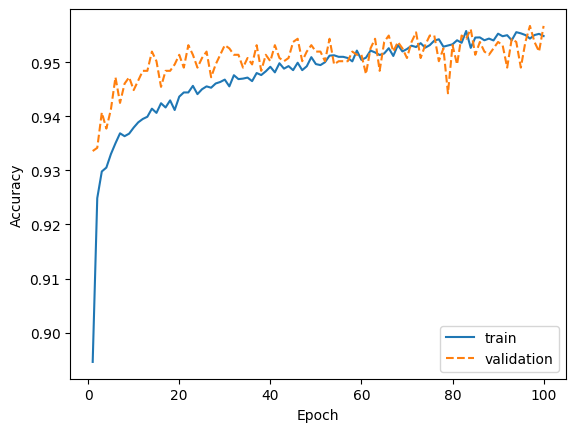

1002/1002 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9574 - loss: 0.1159 - val_accuracy: 0.9567 - val_loss: 0.1289
Restoring model weights from the end of the best epoch: 97.


In [124]:
early_stopping = EarlyStopping(monitor='val_accuracy', verbose=1, mode='max',\
                               restore_best_weights=True, patience=50)
history = model.fit(x_train, y_train,
                    epochs=100,
                    batch_size=32,
                    validation_data=(x_test, y_test),
                    callbacks=[plot_losses,early_stopping])

53/53 - 0s - 2ms/step - accuracy: 0.9567 - loss: 0.1286
Test accuracy: 0.9567


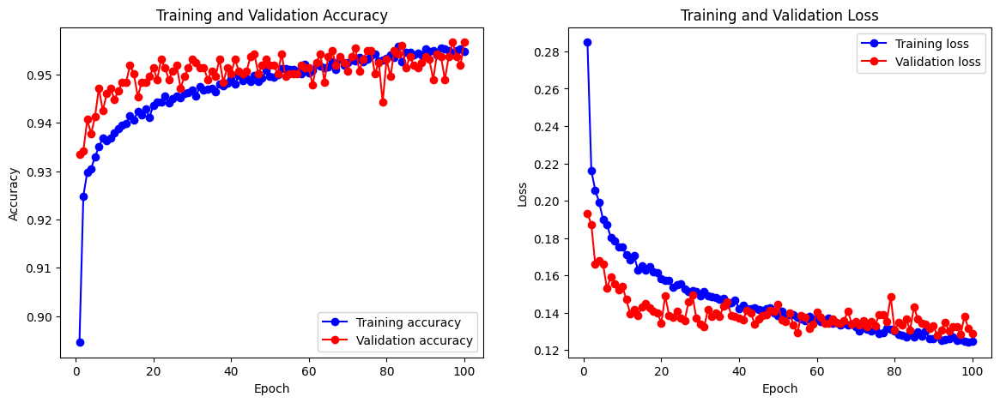

In [125]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f'Test accuracy: {test_acc:.4f}')
ml_plot(history)

In [126]:
pred_train_prob = model.predict(x_train).reshape(-1)# predicted class
pred_test_prob = model.predict(x_test).reshape(-1)

1002/1002 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


1002/1002 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Confusion matrix, without normalization
[[15692   326]
 [  769 15247]]


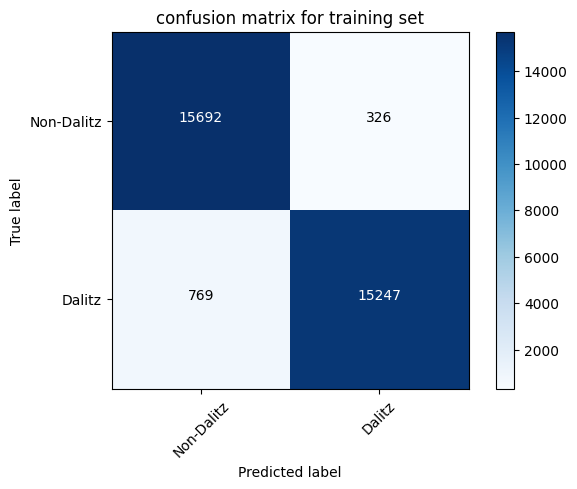

Normalized confusion matrix
[[0.98 0.02]
 [0.05 0.95]]


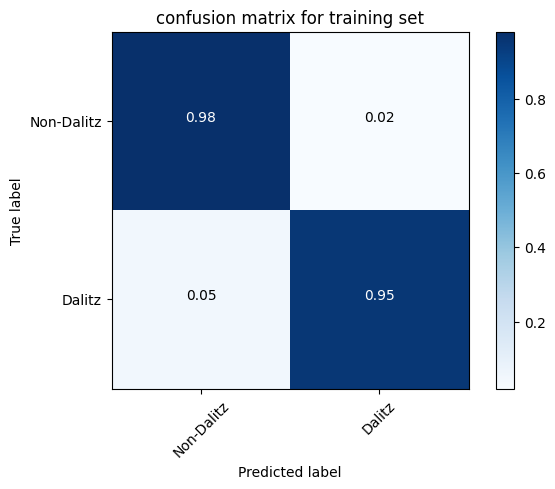

In [127]:
y_pred_train = np.around(model.predict(x_train)).reshape(-1).astype(int) # predicted class
cnf_matrix = confusion_matrix(y_train,y_pred_train)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()


plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='confusion matrix for training set')
plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Confusion matrix, without normalization
[[805  37]
 [ 36 808]]


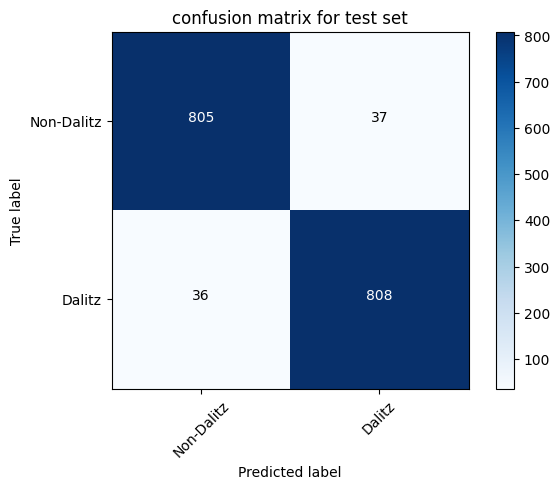

Normalized confusion matrix
[[0.96 0.04]
 [0.04 0.96]]


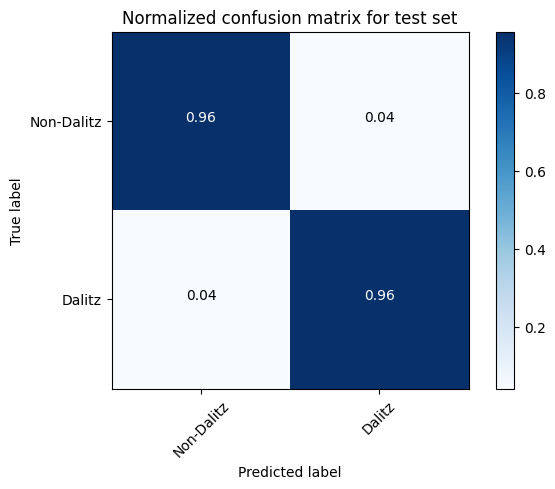

In [128]:
y_pred_test = np.around(model.predict(x_test)).reshape(-1).astype(int) # predicted class
cnf_matrix = confusion_matrix(y_test,y_pred_test)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for test set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for test set')

plt.show()

In [129]:
eva(y_test,y_pred_test)

Accuracy: 0.9567022538552787
Precision: 0.9562130177514793
Recall: 0.957345971563981
F1-score: 0.9567791592658378


## ANN model with feature selection

---



## feature selection without dropping column (ANN_r)

In [279]:
inputs = Input(shape=(x_train_r.shape[1],))

x = Dense(128, activation='relu')(inputs)
x = Dropout(0.2)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.1)(x)
x = Dense(32, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)

model_r = Model(inputs=inputs, outputs=outputs)

opt = optimizers.Adam(learning_rate=0.002)
model_r.compile(optimizer= opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [280]:
model_r.summary()

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_31 (InputLayer)          │ (None, 26)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_111 (Dense)                    │ (None, 128)                 │           3,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_40 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_112 (Dense)                    │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_113 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_114 (Dense)                    │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,825 (54.00 KB)

 Trainable params: 13,825 (54.00 KB)

 Non-trainable params: 0 (0.00 B)

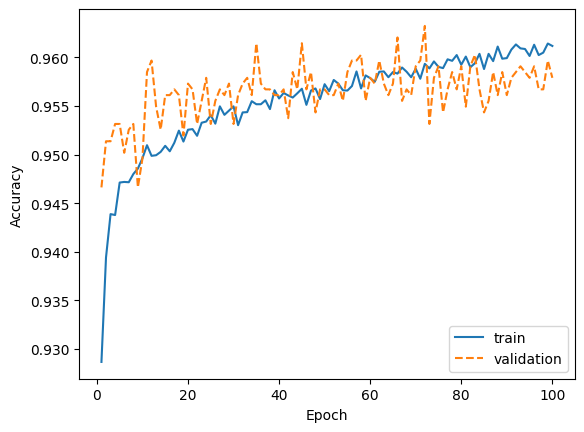

1002/1002 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9611 - loss: 0.1097 - val_accuracy: 0.9579 - val_loss: 0.1205
Restoring model weights from the end of the best epoch: 72.


In [281]:
early_stopping = EarlyStopping(monitor='val_accuracy', verbose=1, mode='max',\
                               restore_best_weights=True, patience=50)
history_r = model_r.fit(x_train_r, y_train,
                    epochs=100,
                    batch_size=32,
                    validation_data=(x_test_r, y_test),
                    callbacks=[plot_losses,early_stopping])

53/53 - 0s - 2ms/step - accuracy: 0.9632 - loss: 0.1121
Test accuracy: 0.9632


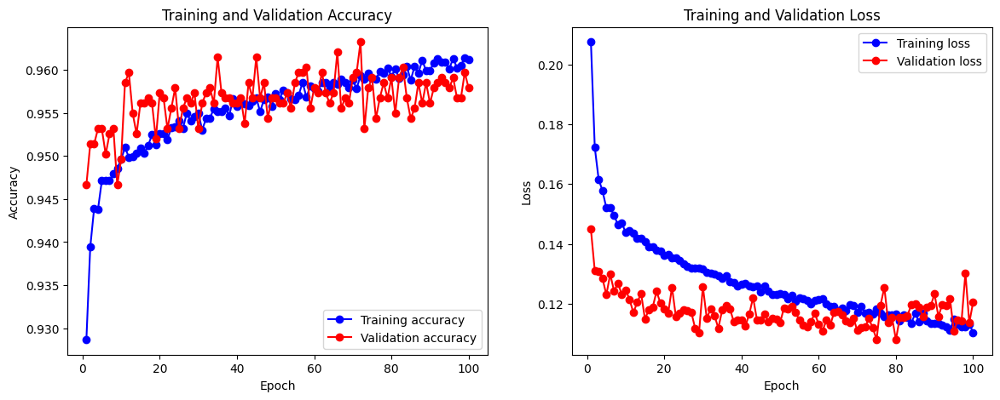

In [282]:
test_loss, test_acc = model_r.evaluate(x_test_r, y_test, verbose=2)
print(f'Test accuracy: {test_acc:.4f}')
ml_plot(history_r)


1002/1002 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
Confusion matrix, without normalization
[[15645   373]
 [  793 15223]]


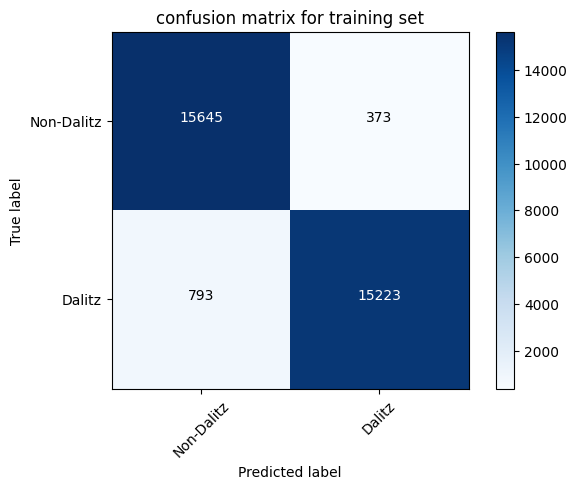

Normalized confusion matrix
[[0.98 0.02]
 [0.05 0.95]]


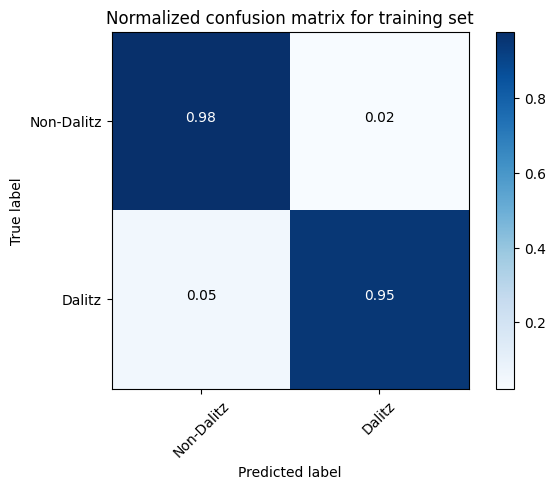

In [283]:
y_pred_train_r = np.around(model_r.predict(x_train_r)).reshape(-1).astype(int) # predicted class
cnf_matrix = confusion_matrix(y_train,y_pred_train_r)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for training set')

plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Confusion matrix, without normalization
[[812  30]
 [ 32 812]]


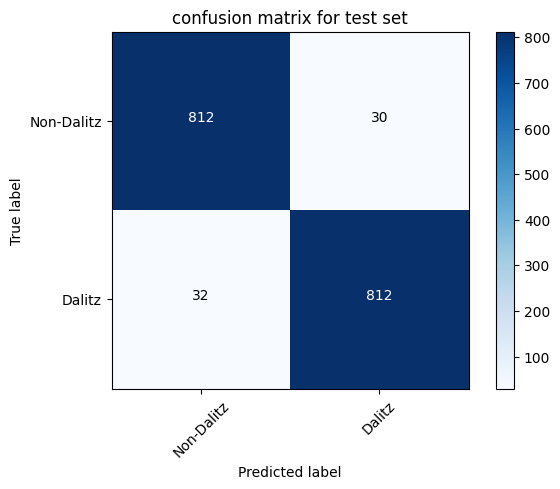

Normalized confusion matrix
[[0.96 0.04]
 [0.04 0.96]]


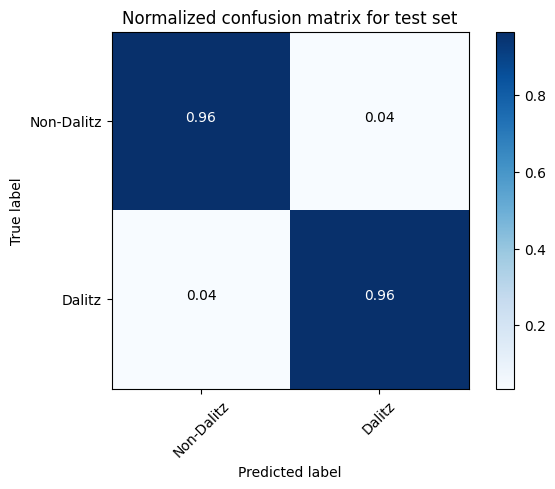

In [284]:
y_pred_test_r = np.around(model_r.predict(x_test_r)).reshape(-1).astype(int) # predicted class
cnf_matrix = confusion_matrix(y_test,y_pred_test_r)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for test set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for test set')

plt.show()

In [285]:
eva(y_test,y_pred_test_r)

Accuracy: 0.963226571767497
Precision: 0.9643705463182898
Recall: 0.9620853080568721
F1-score: 0.963226571767497


## feature selection with dropping column (ANN_c)

In [310]:
inputs = Input(shape=(x_train_c.shape[1],))

x = Dense(128, activation='relu')(inputs)
x = Dropout(0.2)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.1)(x)
x = Dense(32, activation='relu')(x)

outputs = Dense(1, activation='sigmoid')(x)

model_c = Model(inputs=inputs, outputs=outputs)

opt = optimizers.Adam(learning_rate=0.002)
model_c.compile(optimizer= opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [311]:
model_c.summary()

Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)          │ (None, 26)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_135 (Dense)                    │ (None, 128)                 │           3,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_51 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_136 (Dense)                    │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_52 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_137 (Dense)                    │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_138 (Dense)                    │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,825 (54.00 KB)

 Trainable params: 13,825 (54.00 KB)

 Non-trainable params: 0 (0.00 B)

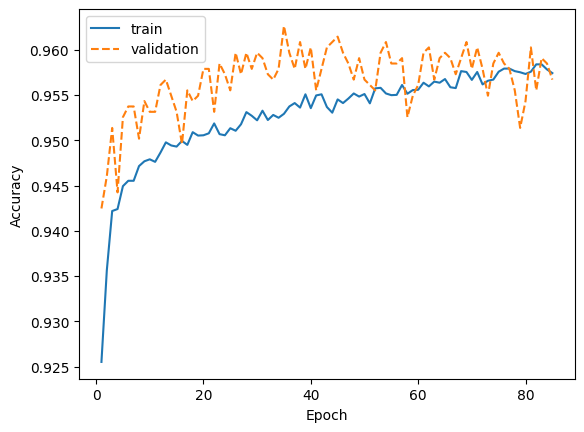

1002/1002 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9602 - loss: 0.1148 - val_accuracy: 0.9567 - val_loss: 0.1175
Epoch 85: early stopping
Restoring model weights from the end of the best epoch: 35.


In [312]:
early_stopping = EarlyStopping(monitor='val_accuracy', verbose=1, mode='max',\
                               restore_best_weights=True, patience=50)
history_c = model_c.fit(x_train_c, y_train,
                    epochs=100,
                    batch_size=32,
                    validation_data=(x_test_c, y_test),
                    callbacks=[plot_losses,early_stopping])

53/53 - 0s - 2ms/step - accuracy: 0.9626 - loss: 0.1135
Test accuracy: 0.9626


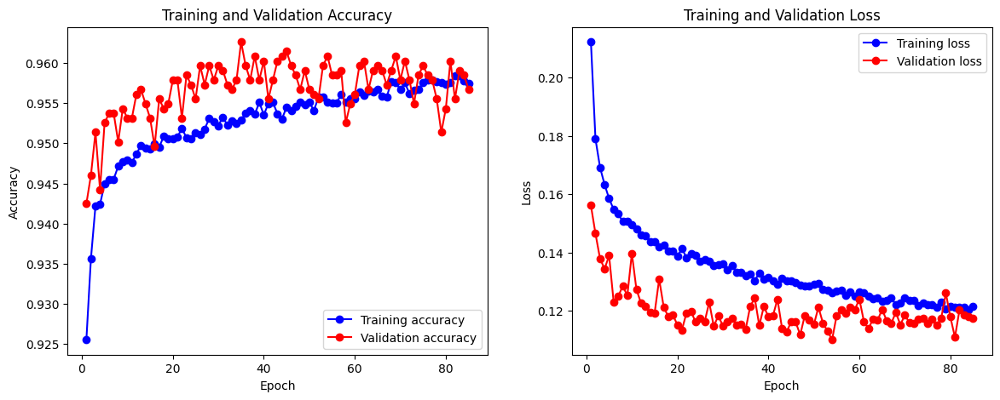

In [313]:
test_loss, test_acc = model_c.evaluate(x_test_c, y_test, verbose=2)
print(f'Test accuracy: {test_acc:.4f}')
ml_plot(history_c)

1002/1002 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Confusion matrix, without normalization
[[15648   370]
 [  979 15037]]


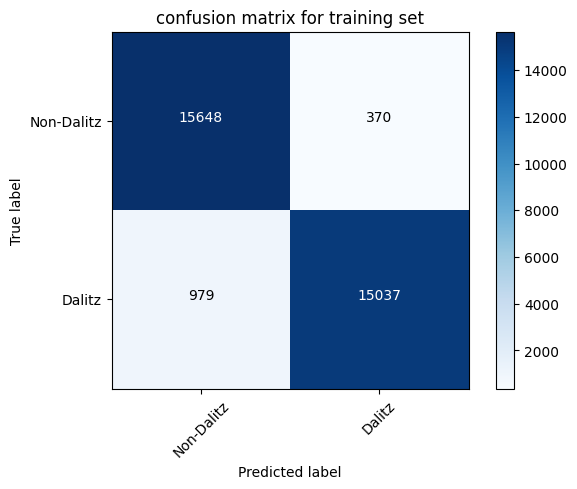

Normalized confusion matrix
[[0.98 0.02]
 [0.06 0.94]]


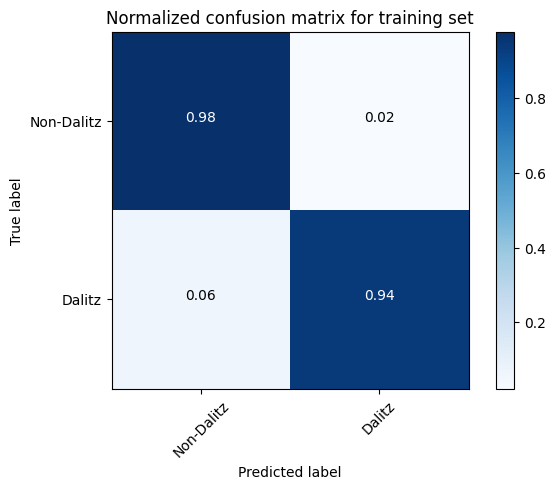

In [317]:
y_pred_train_c = np.around(model_c.predict(x_train_c)).reshape(-1).astype(int) # predicted class
cnf_matrix = confusion_matrix(y_train,y_pred_train_c)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for training set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for training set')

plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Confusion matrix, without normalization
[[814  28]
 [ 35 809]]


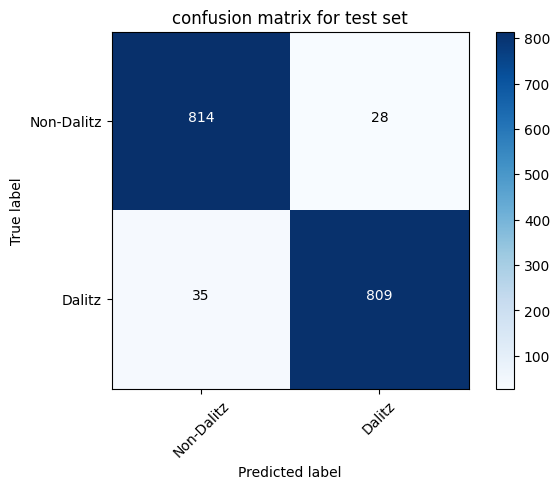

Normalized confusion matrix
[[0.97 0.03]
 [0.04 0.96]]


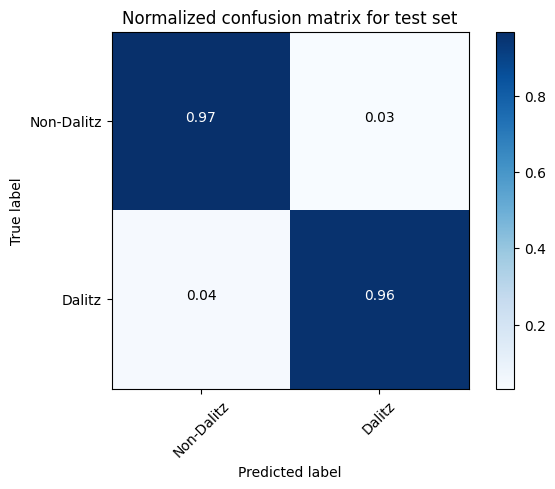

In [318]:
y_pred_test_c = np.around(model_c.predict(x_test_c)).reshape(-1).astype(int) # predicted class
cnf_matrix = confusion_matrix(y_test,y_pred_test_c)
np.set_printoptions(precision=2)

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=False,
                      title='confusion matrix for test set')

plt.show()

plot_confusion_matrix(cnf_matrix, classes=['Non-Dalitz', 'Dalitz'], normalize=True,
                      title='Normalized confusion matrix for test set')

plt.show()

In [319]:
eva(y_test,y_pred_test_c)

Accuracy: 0.9626334519572953
Precision: 0.966547192353644
Recall: 0.9585308056872038
F1-score: 0.9625223081499108
